#**TITLE**
* **Program Name:** IIMK - Data Science and Artificial Intelligence
* **Project Title:** Why Do Employees Quit? *(Employee Attrition Analysis & Prediction)*
* **Project By:** Vivek Tanaji Kulthe
* **Progress State:** Week 6

# **BACKGROUND**

**Organization Background:**

ABC Technologies, is facing a concerning trend of high employee attrition even though they offer a competitive salary and benefits package.

**Problem Statement:**

This suggests the root cause of attrition lies beyond financial compensation. Company wants to identify the underlying factors driving employee departures to improve retention and maintain a strong talent pool.



**Challenges Faced:**


*   Project Delays
*   Reputational Damage
*   Low Employee Morale
*   Recruitement Cost Increase
*   Training Cost Increase

# **OBJECTIVE**

* Analyze & Visualize the employee data to uncover trends and patterns related to employee attrition

* Identify key attributes associated with departing employees, viz;
  * Demographic Factors
  * Compensation and Benefits
  * Work Environment
  * Job Satisfaction
  * Managerial Influence
  * Career Progression

* Build a regression model to predict if an employee is at a risk of attrition

* Analyze model performance to identify the most significant predictors of attrition

# **PYTHON LIBRARIES**

In [1]:
# Importing sys and os
# OS module is responsible for interacting with the operating system, providing access to the underlying interface of the operating system
# SYS module is responsible for the interaction between the program and the Python interpreter
import sys
import os

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

from google.colab import drive
drive.mount('/content/drive', force_remount=True)

#pd.options.display.max_columns = None

# The warnings filter controls whether warnings are ignored, displayed, or turned into errors (raising an exception)
# 'ignore' = never print matching warnings
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
pd.set_option('display.max_columns', 50)
import numpy as np
import re
from scipy import stats

import seaborn as sns
sns.set(rc = {'figure.figsize' : (14, 10)})
sns.set_style('whitegrid')
sns.color_palette('tab20')

import matplotlib as mpl
import matplotlib.pyplot as plt

import sklearn as sk
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# libraries for modeling
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

import xgboost as xgb
from xgboost import XGBClassifier


#check the version
print('python', sys.version)
for pkg in [pd, np, mpl, sns, sk]:  #, im, xgb
   print(pkg.__name__, pkg.__version__)


Mounted at /content/drive
python 3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]
pandas 2.0.3
numpy 1.25.2
matplotlib 3.7.1
seaborn 0.13.1
sklearn 1.2.2


In [2]:
# For formatting charts

from matplotlib import rcParams
rcParams['lines.linewidth'] = 2
rcParams['xtick.labelsize'] = 10
rcParams['ytick.labelsize'] = 10
rcParams['axes.labelsize'] = 10
rcParams['axes.titlesize'] = 10
rcParams['axes.titlepad'] = 10.0
rcParams['figure.dpi'] = 300
rcParams['savefig.dpi'] = 300

# set custom font ()
font_path = '/content/drive/MyDrive/Colab Notebooks/resources/BentonSans-Regular.ttf'
import matplotlib.font_manager as fm
fm.fontManager.addfont(font_path)
plt.rc('font', family='BentonSans')
plt.figure(facecolor='white')

<Figure size 4200x3000 with 0 Axes>

<Figure size 4200x3000 with 0 Axes>

# **OBTAINING THE DATA :** *(O OF OSEMN)*
## ⛁ Gather The Data From Relevant Sources

## Dataset Used
* The dataset that will be used is taken from kaggle and contains HR analytics data of employees that stay and leave

* The types of data include metrics such as Education, Environment Satisfaction, Job Involvement, Job Satisfaction, Performance Rating, Relationship Satisfaction, Work-Life Balance, Commute Distance, etc.

* Asset:[Employee Attrition Data](https://github.com/IBM/employee-attrition-aif360/blob/master/data/emp_attrition.csv)

* License: [Open Database License](https://opendatacommons.org/licenses/odbl/1.0/https://) / [Database Content License](https://opendatacommons.org/licenses/dbcl/1.0/)

* Source Link: [Kaggle](https://www.kaggle.com/pavansubhasht/ibm-hr-analytics-attrition-dataset)

**Reading The File**

In [3]:
gd_path = '/content/drive/MyDrive/Colab Notebooks'
fname = 'dataset/WA_Fn-UseC_-HR-Employee-Attrition.csv'
data = f"{gd_path}/{fname}"
df=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/dataset/WA_Fn-UseC_-HR-Employee-Attrition.csv')

**Taking the glance at the data**

In [4]:
# Take a glance at first 10 rows for quickly testing if our object has the right type of data in it
df.head(10)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2
5,32,No,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,1,8,4,Male,79,3,1,Laboratory Technician,4,Single,3068,11864,0,Y,No,13,3,3,80,0,8,2,2,7,7,3,6
6,59,No,Travel_Rarely,1324,Research & Development,3,3,Medical,1,10,3,Female,81,4,1,Laboratory Technician,1,Married,2670,9964,4,Y,Yes,20,4,1,80,3,12,3,2,1,0,0,0
7,30,No,Travel_Rarely,1358,Research & Development,24,1,Life Sciences,1,11,4,Male,67,3,1,Laboratory Technician,3,Divorced,2693,13335,1,Y,No,22,4,2,80,1,1,2,3,1,0,0,0
8,38,No,Travel_Frequently,216,Research & Development,23,3,Life Sciences,1,12,4,Male,44,2,3,Manufacturing Director,3,Single,9526,8787,0,Y,No,21,4,2,80,0,10,2,3,9,7,1,8
9,36,No,Travel_Rarely,1299,Research & Development,27,3,Medical,1,13,3,Male,94,3,2,Healthcare Representative,3,Married,5237,16577,6,Y,No,13,3,2,80,2,17,3,2,7,7,7,7


In [5]:
# create a backup of original dataset for future use
df_raw = df.copy()

**Understanding The Dataframe**

In [6]:
# Let's see number of columns, column labels, column data types, memory usage, range index, and non-null information about DataFrame
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

From the information above, we can know that:
* The dataset has a total of 35 columns and 1470 rows
* There are no *null* or *missing values* in each column
* The `attrition` column is a classification target with the data type `object`
* The other columns are *feature* with data types `int64` (26 columns) and `object` (8 columns)

## Understanding The Data (Data Level and Types)




### Qualitative Data Types

####Nominal Data Types (Identify & Mark)

In [7]:
# Qualitative - Nominal (N)
qual_n = [
    'Attrition', # target
    'BusinessTravel',
    'Department',
    'EducationField',
    'EmployeeNumber', # id
    'Gender',
    'JobRole',
    'MaritalStatus',
    'Over18',
    'OverTime',
]

####Ordinal Data Types (Identify & Mark)

In [8]:
# Qualitative - Ordinal (O)

qual_o = [
    'Education', # desc
    'EnvironmentSatisfaction', # desc
    'JobInvolvement', # desc
    'JobLevel',
    'JobSatisfaction', # desc
    'PerformanceRating', # desc
    'RelationshipSatisfaction', # desc
    'StockOptionLevel',
    'WorkLifeBalance', # desc
]

In [9]:
#Combined Qualitative Data Set (Nominal + Ordinal)
qual = qual_n + qual_o
df_qual = df[qual]
df_qual.head(10)

,Attrition,BusinessTravel,Department,EducationField,EmployeeNumber,Gender,JobRole,MaritalStatus,Over18,OverTime,Education,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobSatisfaction,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,WorkLifeBalance
0,Yes,Travel_Rarely,Sales,Life Sciences,1,Female,Sales Executive,Single,Y,Yes,2,2,3,2,4,3,1,0,1
1,No,Travel_Frequently,Research & Development,Life Sciences,2,Male,Research Scientist,Married,Y,No,1,3,2,2,2,4,4,1,3
2,Yes,Travel_Rarely,Research & Development,Other,4,Male,Laboratory Technician,Single,Y,Yes,2,4,2,1,3,3,2,0,3
3,No,Travel_Frequently,Research & Development,Life Sciences,5,Female,Research Scientist,Married,Y,Yes,4,4,3,1,3,3,3,0,3
4,No,Travel_Rarely,Research & Development,Medical,7,Male,Laboratory Technician,Married,Y,No,1,1,3,1,2,3,4,1,3
5,No,Travel_Frequently,Research & Development,Life Sciences,8,Male,Laboratory Technician,Single,Y,No,2,4,3,1,4,3,3,0,2
6,No,Travel_Rarely,Research & Development,Medical,10,Female,Laboratory Technician,Married,Y,Yes,3,3,4,1,1,4,1,3,2
7,No,Travel_Rarely,Research & Development,Life Sciences,11,Male,Laboratory Technician,Divorced,Y,No,1,4,3,1,3,4,2,1,3
8,No,Travel_Frequently,Research & Development,Life Sciences,12,Male,Manufacturing Director,Single,Y,No,3,4,2,3,3,4,2,0,3
9,No,Travel_Rarely,Research & Development,Medical,13,Male,Healthcare Representative,Married,Y,No,3,3,3,2,3,3,2,2,2


In [10]:
# Let's check the data types for identified Nominal Data
df[qual_n].dtypes

Attrition         object
BusinessTravel    object
Department        object
EducationField    object
EmployeeNumber     int64
Gender            object
JobRole           object
MaritalStatus     object
Over18            object
OverTime          object
dtype: object

In [11]:
# Let's check the data types for identified Ordinal Data (if there is need to decode the columns)
df[qual_o].dtypes

Education                   int64
EnvironmentSatisfaction     int64
JobInvolvement              int64
JobLevel                    int64
JobSatisfaction             int64
PerformanceRating           int64
RelationshipSatisfaction    int64
StockOptionLevel            int64
WorkLifeBalance             int64
dtype: object

In [12]:
df[qual].dtypes

Attrition                   object
BusinessTravel              object
Department                  object
EducationField              object
EmployeeNumber               int64
Gender                      object
JobRole                     object
MaritalStatus               object
Over18                      object
OverTime                    object
Education                    int64
EnvironmentSatisfaction      int64
JobInvolvement               int64
JobLevel                     int64
JobSatisfaction              int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StockOptionLevel             int64
WorkLifeBalance              int64
dtype: object

###Quantitative Data Types

####Interval Data Types (Identify & Mark)

In [13]:
# Quantitative - Interval (I)
quant_i = [
    'Age',
    'DistanceFromHome',
    'EmployeeCount', # 1
    'NumCompaniesWorked',
    'StandardHours', # 1
    'TrainingTimesLastYear'
]

####Ratio Data Types (Identify & Mark)

In [14]:
# Quantitative Ratio (R)
quant_r = [
    'DailyRate',
    'HourlyRate',
    'MonthlyRate',
    'PercentSalaryHike', # percentage
    'TotalWorkingYears',
    'MonthlyIncome',
    'YearsAtCompany',
    'YearsInCurrentRole',
    'YearsSinceLastPromotion',
    'YearsWithCurrManager'
]

In [15]:
quant = quant_i + quant_r
df_quant = df[quant]
df_quant.head(3)

,Age,DistanceFromHome,EmployeeCount,NumCompaniesWorked,StandardHours,TrainingTimesLastYear,DailyRate,HourlyRate,MonthlyRate,PercentSalaryHike,TotalWorkingYears,MonthlyIncome,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,1,8,80,0,1102,94,19479,11,8,5993,6,4,0,5
1,49,8,1,1,80,3,279,61,24907,23,10,5130,10,7,1,7
2,37,2,1,6,80,3,1373,92,2396,15,7,2090,0,0,0,0


#**SCRUBBING THE DATA:** *(S OF OSEMN)*
##🗑 Clean data to formats that machine understands

## Data Cleansing

In [16]:
# copying the raw dataset
df_clean = df_raw.copy()

* `df_raw` = raw dataset
* `df_clean` = dataset that has been cleaned (drop columns, drop rows, encoding, etc.)

Note: Use `df_clean` if you want to carry out a cleansing process so that the raw data retains its value.

### Handling Single & Unique Data

Note:
* Single data in question is a column that has only 1 unique value.
* Unique data in question is a column whose entire row contains a unique value (such as `employee number`).

In [17]:
df_clean.nunique()

Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EmployeeCount                  1
EmployeeNumber              1470
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
Over18                         1
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBa

Observation:
* `EmployeeCount`, `Over18`, `StandardHours` are columns that only have 1 unique value.
* `EmployeeNumber` is a column whose entire row contains a unique value.

In [18]:
bef = len(df_clean.columns) # number of columns before removal
df_clean = df_clean.drop(['EmployeeCount', 'Over18', 'StandardHours', 'EmployeeNumber'], axis = 1) # columns dropped
aft = len(df_clean.columns) # number of columns after removal
print(f"The number of columns are reduced from {bef} to {aft}.")

The number of columns are reduced from 35 to 31.


Observation:
* The number of columns are reduced from 35 to 31

### Handling Missing Data

In [19]:
df_clean.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSinceLastPromotion     0
YearsWithCurrManager        0
dtype: int64

Observation:
* There is no empty (null) data in any column in the dataframe

### Handling Duplicated Data

In [20]:
df_clean.duplicated().sum()

0

Observation:
* There are no duplicates in each column

### Handling Outliers
(Using Univariate Analysis)

In [21]:
df_quant.describe()

,Age,DistanceFromHome,EmployeeCount,NumCompaniesWorked,StandardHours,TrainingTimesLastYear,DailyRate,HourlyRate,MonthlyRate,PercentSalaryHike,TotalWorkingYears,MonthlyIncome,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.0,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,9.192517,1.0,2.693197,80.0,2.799320,802.485714,65.891156,14313.103401,15.209524,11.279592,6502.931293,7.008163,4.229252,2.187755,4.123129
std,9.135373,8.106864,0.0,2.498009,0.0,1.289271,403.509100,20.329428,7117.786044,3.659938,7.780782,4707.956783,6.126525,3.623137,3.222430,3.568136
min,18.000000,1.000000,1.0,0.000000,80.0,0.000000,102.000000,30.000000,2094.000000,11.000000,0.000000,1009.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,2.000000,1.0,1.000000,80.0,2.000000,465.000000,48.000000,8047.000000,12.000000,6.000000,2911.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,7.000000,1.0,2.000000,80.0,3.000000,802.000000,66.000000,14235.500000,14.000000,10.000000,4919.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,14.000000,1.0,4.000000,80.0,3.000000,1157.000000,83.750000,20461.500000,18.000000,15.000000,8379.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,29.000000,1.0,9.000000,80.0,6.000000,1499.000000,100.000000,26999.000000,25.000000,40.000000,19999.000000,40.000000,18.000000,15.000000,17.000000


In [22]:
df_quant.shape[0]

1470

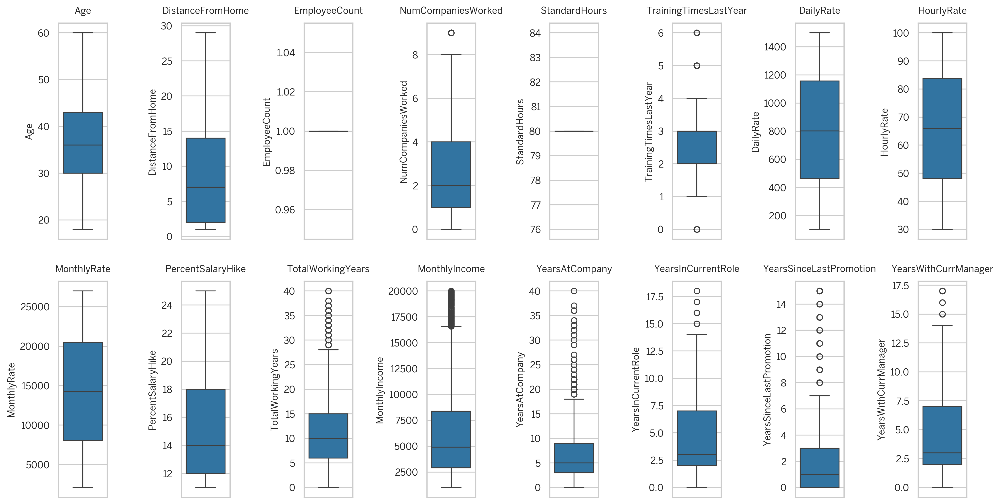

In [23]:
plt.figure(figsize = (15, 8))

for i in range(0, len(quant)):
    plt.subplot(2, 8, i+1)
    sns.boxplot(y = df[quant[i]], palette = "tab20", orient = 'v')
    plt.title(quant[i], fontweight = 'bold')

plt.tight_layout(pad = 2.0)
plt.show()

From the box plot above, we can see that:
* There are quite a lot of *outliers* in the column:
  * `TotalWorkingYears`
  * `TrainingTimesLastYear`
  * `YearsAtCompany`
  * `YearsInCurrentRole`
  * `YearsSinceLastPromotion`
  * `YearsWithCurrManager`
  * `MonthlyIncome`
* Most of the columns containing *outliers* are total years of data, meaning that each employee's experience is quite varied.

In [24]:
# Considering the above chart, column from which outliers needs to be removed are;
cols = ['TrainingTimesLastYear','TotalWorkingYears','MonthlyIncome','YearsAtCompany','YearsInCurrentRole','YearsSinceLastPromotion','YearsWithCurrManager']

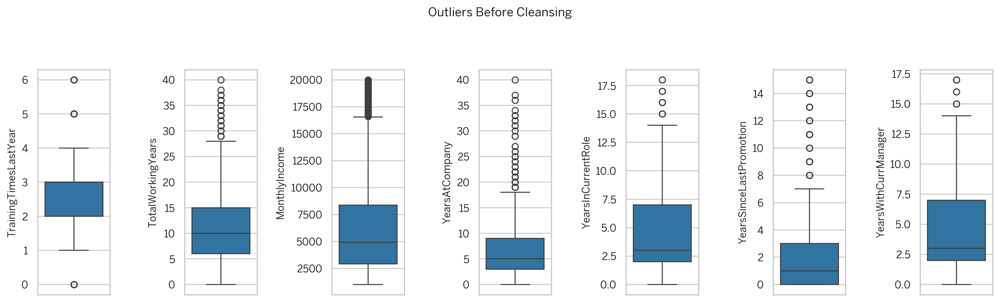

In [25]:
# Before
plt.figure(figsize = (14, 4))
for i in range(0, len(cols)):
    plt.subplot(1, 7, i+1)
    sns.boxplot(y = df_clean[cols[i]], palette = "tab20", orient = 'v')

plt.suptitle('Outliers Before Cleansing', y = 1.05, fontsize = 12)
plt.tight_layout(pad = 1.5)
plt.show()

#### Z-Score Method

In [26]:
print(f'Number of rows before removing outliers: {len(df_clean)}')

filtered_entries = np.array([True] * len(df_clean))

for col in cols:
    zscore = abs(stats.zscore(df_clean[col])) # calculate the absolute z-score
    filtered_entries = (zscore < 3) & filtered_entries # keep less than 3 absolute z-scores

df_ZSCORE = df_clean[filtered_entries] # filter, only take those whose z-score is below 3

print(f'Number of rows after removing outliers: {len(df_ZSCORE)}')

Number of rows before removing outliers: 1470
Number of rows after removing outliers: 1387


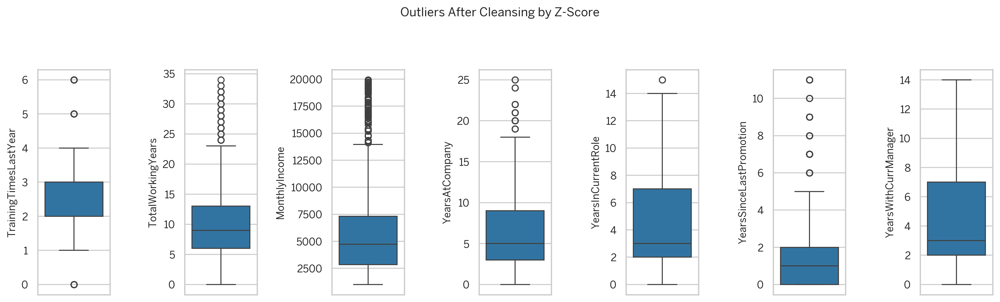

In [27]:
# After using Z-SCORE
plt.figure(figsize = (14, 4))
for i in range(0, len(cols)):
    plt.subplot(1, 7, i+1)
    sns.boxplot(y = df_ZSCORE[cols[i]], palette = "tab20", orient = 'v')

plt.suptitle('Outliers After Cleansing by Z-Score', y = 1.05, fontsize = 12)
plt.tight_layout(pad = 1.5)
plt.show()

#### IQR (Inter-Quartile Range) Method

In [28]:
print(f'Number of rows before removing outliers: {len(df_clean)}')

filtered_entries = np.array([True] * len(df_clean))
for col in cols:
    Q1 = df_clean[col].quantile(0.25)
    Q3 = df_clean[col].quantile(0.75)
    IQR = Q3 - Q1
    low_limit = Q1 - (IQR * 1.5)
    high_limit = Q3 + (IQR * 1.5)

    filtered_entries = ((df_clean[col] >= low_limit) & (df_clean[col] <= high_limit)) & filtered_entries

df_IQR = df_clean[filtered_entries]

print(f'Number of rows after removing outliers: {len(df_IQR)}')

Number of rows before removing outliers: 1470
Number of rows after removing outliers: 1024


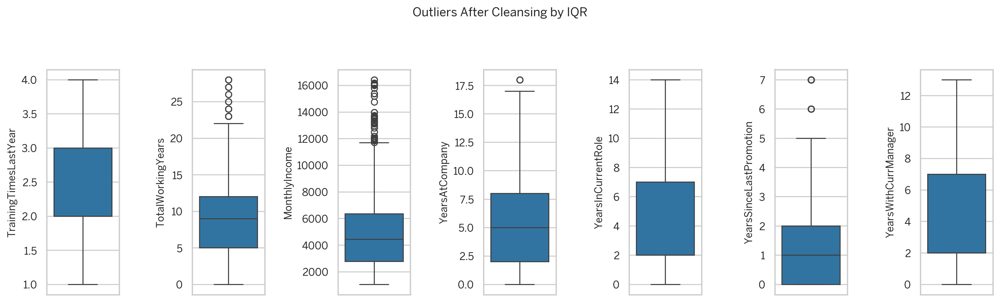

In [29]:
# After using IQR
plt.figure(figsize = (14, 4))
for i in range(0, len(cols)):
    plt.subplot(1, 7, i+1)
    sns.boxplot(y = df_IQR[cols[i]], palette = "tab20", orient = 'v')

plt.suptitle('Outliers After Cleansing by IQR', y = 1.05, fontsize = 12)
plt.tight_layout(pad = 1.5)
plt.show()

#### Result

Z-Score
* Number of rows before removing outliers: 1470
* Number of rows after removing outliers: 1387
* Number of rows removed: 83

IQR
* Number of rows before removing outliers: 1470
* Number of rows after removing outliers: 1024
* Number of rows removed: 446

Observation:
* Z-Score Method is more suitable because IQR is removing lot of data from the dataset.

In [30]:
df_clean = df_ZSCORE.copy()
df_clean.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,No,23,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Yes,15,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Yes,11,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,No,12,3,4,1,6,3,3,2,2,2,2


#**EXPLORING THE DATA** *(E OF OSEMN)*

## **DESCRIPTIVE ANALYTICS**

###Calculate Business Metrics **(COMPANY LEVEL ATTRITION RATE)**

**Calculate Attrition Rate for ABC Technologies**

>**How to Calculate Employee Turnover Rate?<br>**
>To calculate employee turnover rate, you’ll need to know, within a given time period, the number of employee separations and the average number of employees present.
>The average number of employees can be determined by adding together the number of employees on the first day and the last day of the time period, then dividing that sum total by two.

[(Source)](https://builtin.com/recruiting/cost-of-turnover)

Then, plug the above values into the following turnover rate formula:
```
Turnover rate = [(# of employee separations) / (average # of employees)] x 100
```



In [31]:
df_attrition = df[['Attrition', 'JobLevel', 'MonthlyIncome', 'YearsAtCompany']].copy()
df_attrition.head()

,Attrition,JobLevel,MonthlyIncome,YearsAtCompany
0,Yes,2,5993,6
1,No,2,5130,10
2,Yes,1,2090,0
3,No,1,2909,8
4,No,1,3468,2


**Add a column to identify if the employee joined this year**

In [32]:
# is a new employee this year?
ls_jointhisyear = []
for idx, col in df_attrition.iterrows():
    if col['YearsAtCompany'] < 1:
        ls_jointhisyear.append(1) # worked for < 1 year
    else:
        ls_jointhisyear.append(0) # worked for > 1 year

df_attrition['JoinThisYear'] = ls_jointhisyear
df_attrition.head()

,Attrition,JobLevel,MonthlyIncome,YearsAtCompany,JoinThisYear
0,Yes,2,5993,6,0
1,No,2,5130,10,0
2,Yes,1,2090,0,1
3,No,1,2909,8,0
4,No,1,3468,2,0


**Calculate the Attrition Rate**

In [33]:
employee_start = df_attrition.loc[df_attrition['JoinThisYear'] == 0].shape[0] # the beginning of 2020
employee_end = df_attrition.shape[0] # the end of 2020
employee_avg = (employee_start + employee_end) / 2 # average of employees number in 2020
attrition_total = df_attrition.loc[df_attrition['Attrition'] == 'Yes'].shape[0] # total attrition
turnover_rate = attrition_total / employee_avg # turnover rate

print("Employee Attrition in 2020")
print("--------------------------------------------")

# attrition number in 2020
print(f"Average of Employees Number = {employee_avg:.0f} employees")
print(f"Total Attrition Number = {attrition_total} employees")
# specified for each job level
for i in sorted(df_attrition['JobLevel'].unique()):
    attrition_level = df_attrition.loc[(df_attrition['Attrition'] == 'Yes') & (df_attrition['JobLevel'] == i)].shape[0]
    print(f"  - Job Level {i} = {attrition_level} employees")
print("--------------------------------------------")

# turnover rate in 2020
print(f"Attrition Rate = {turnover_rate:.2%}")


Employee Attrition in 2020
--------------------------------------------
Average of Employees Number = 1448 employees
Total Attrition Number = 237 employees
  - Job Level 1 = 143 employees
  - Job Level 2 = 52 employees
  - Job Level 3 = 32 employees
  - Job Level 4 = 5 employees
  - Job Level 5 = 5 employees
--------------------------------------------
Attrition Rate = 16.37%


###Statistical

###Graphical

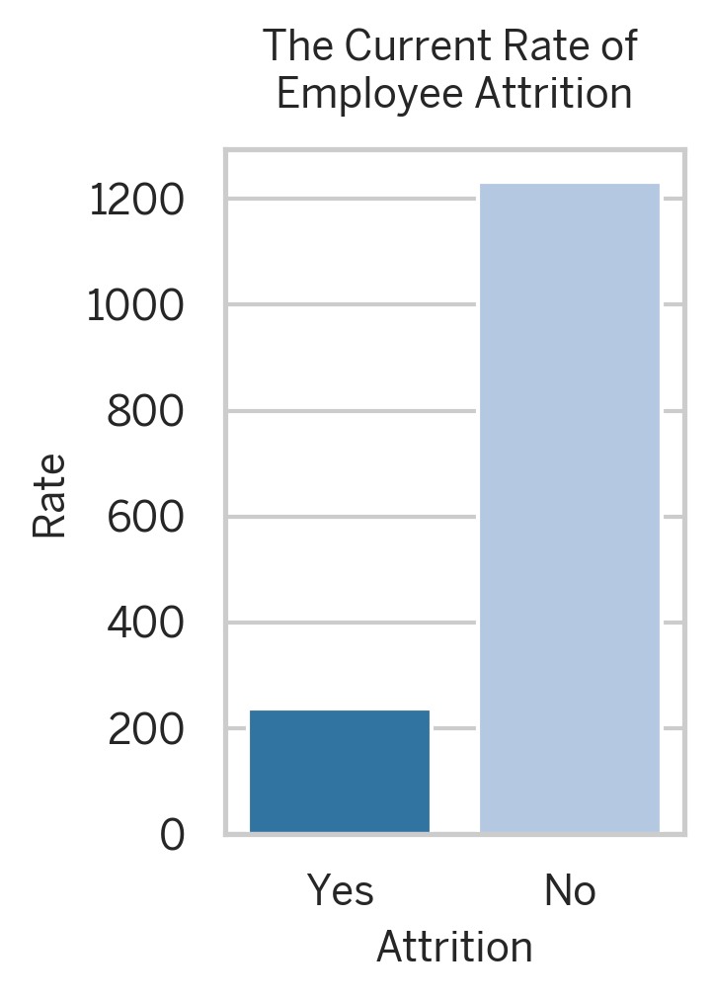

In [34]:
plt.figure(figsize = (2, 3))

sns.countplot(x = 'Attrition', data = df, palette = 'tab20')
# palette = 'coolwarm'
plt.title('The Current Rate of \nEmployee Attrition', fontweight = 'bold')
plt.xlabel('Attrition')
plt.ylabel('Rate')

# plt.savefig(f"{gd_path}/image/attrition-distribution.png", bbox_inches = 'tight', dpi = 150, transparent = True)
# plt.savefig(f"{gd_path}/image/attrition-distribution.jpg", bbox_inches = 'tight', dpi = 150)
plt.show()

####Quantitative Feature Distribution (Histogram)

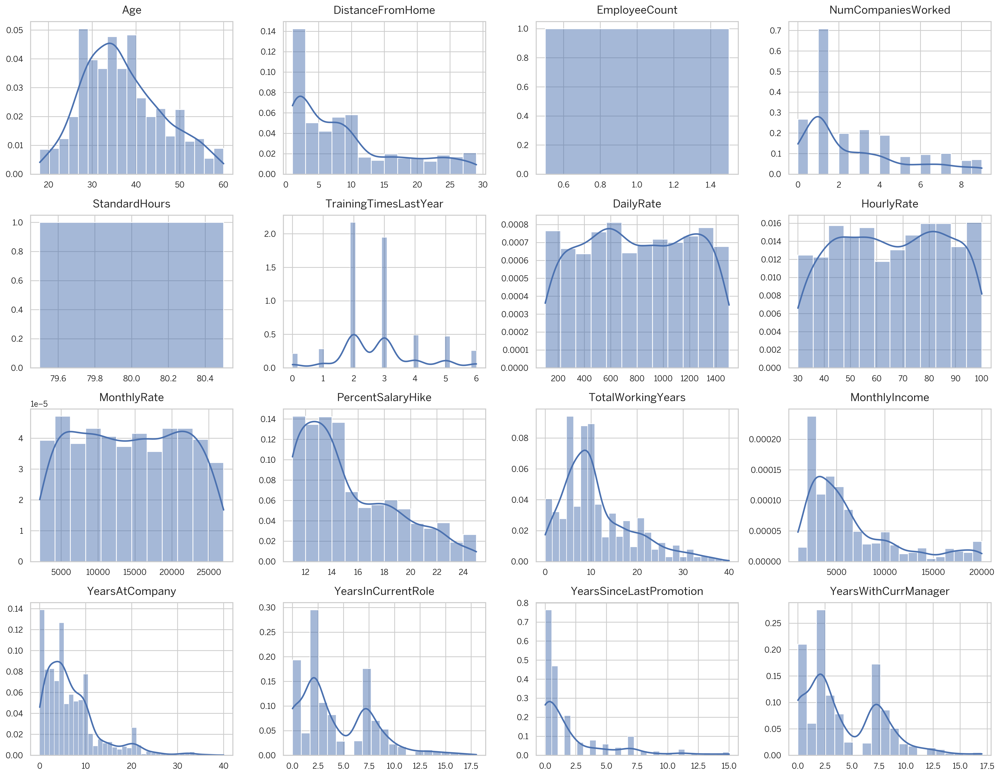

In [35]:
plt.figure(figsize = (18, 14))

for i in range(0, len(quant)):
    plt.subplot(4, 4, i+1)
    sns.histplot(df[quant[i]], palette = "tab20", kde=True, stat="density")  # Add kde and stat
    plt.title(quant[i], fontsize = 14)
    plt.xlabel('')
    plt.ylabel('')

plt.tight_layout()
plt.show()

####Quanlitative Feature Distribution (BarPlot)

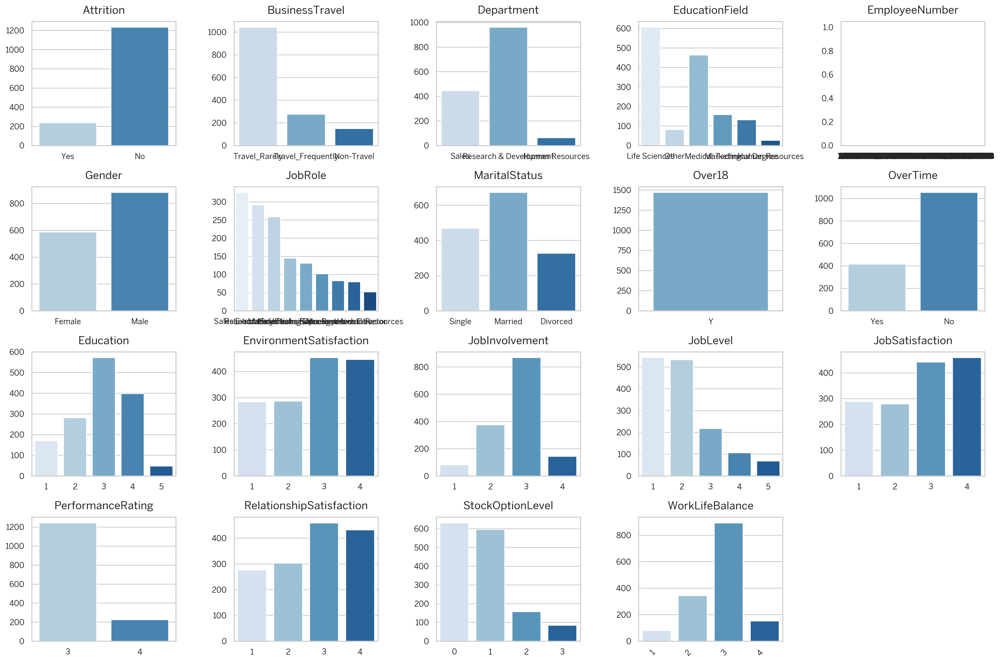

In [36]:
plt.figure(figsize = (18, 12))

for i in range(0, len(qual)):
    plt.subplot(4, 5, i+1)
    sns.countplot(x = qual[i], data = df_qual, palette = "Blues", orient = 'v')
    plt.title(qual[i], fontsize = 14)
    plt.xlabel('')
    plt.ylabel('')

plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

## **Descriptive Analytics Observations**

**Observations:**

The attrition rate of ABC Technologies is 16.37%

**From the QUANTITATIVE attributes Descriptive Analytics, we can observe that:**
* When looking at the Histogram above, the `MonthlyIncome`, `PercentSalaryHike`, `YearsAtCompany` columns are slightly skewed to the right/positively skewed
* Indicating that more employee salaries tend to be low and more employees worked at ABC Technologies less than 1 year.

Apart from those columns, the distribution looks normal


**From the QUALITATIVE attributes Descriptive Analytics, we can observe that:**
* The majority of employees have a high frequency of business trips, namely around 1000 employees.
* *Research & Development* is the department with the largest number of employees, around 900 employees.
* The company is dominated by 800 male employees.
* The company is dominated by married employees
* Only a small number of employees work overtime
* The company is dominated by employees with bachelor's degrees
* Only a small number of employees show extraordinary performance (4: *outstanding*) and there are no employees who have low performance (1: *low*)
</font>

## DIAGNOSTIC ANALYTICS
(Using Multivariate Analysis)

#### Numerical & Categorical Ordinal Correlation (Heatmap)

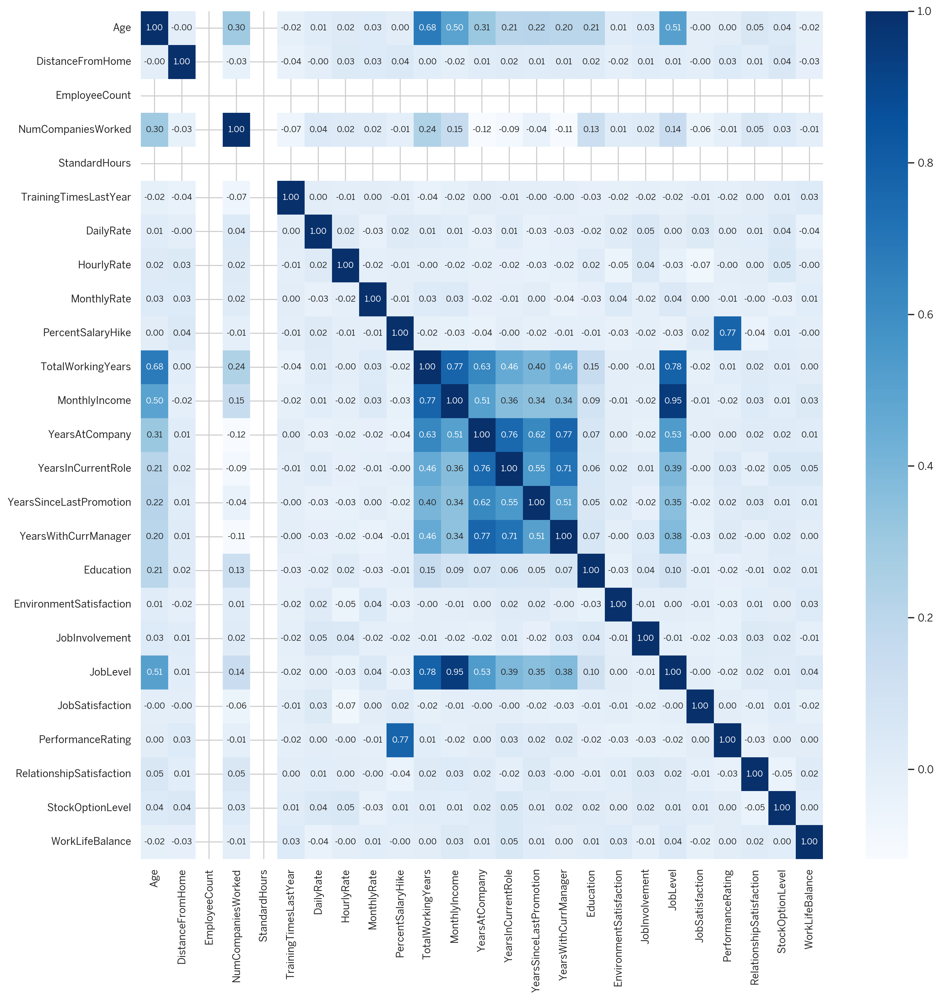

In [37]:
quant_ord = quant + qual_o # quantitative + qualitative ordinal
plt.figure(figsize = (15, 15))
sns.heatmap(df[quant_ord].corr(), cmap = 'Blues', annot = True, annot_kws={"size": 8}, fmt = '.2f')
plt.show()

Observations:

* `PercentSalaryHike` and `PerformanceRating` have a fairly strong positive relationship

* `TotalWorkingYears` has a fairly strong positive relationship with `Age`, `MonthlyIncome`, and `JobLevel`
* `YearsAtCompany` has a fairly strong positive relationship with `YearsInCurrentRole` and `YearsWithCurrManager`

</font>

####Multivariate Analysis (Correlation)

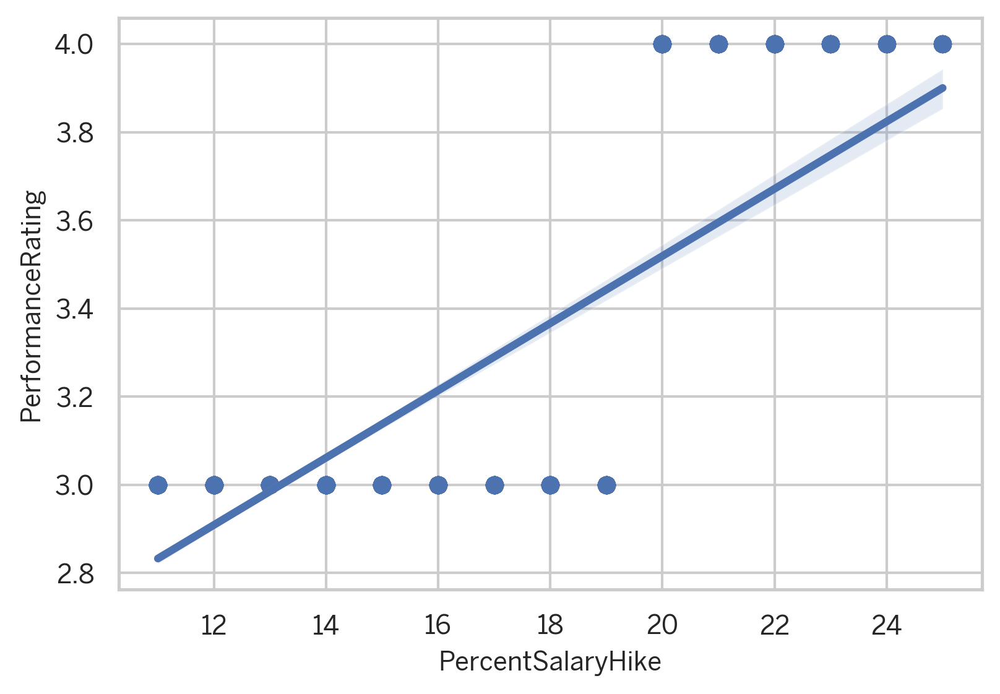

In [38]:
plt.figure(figsize = (6, 4))
sns.regplot(x = 'PercentSalaryHike', y = 'PerformanceRating', data = df)
plt.show()

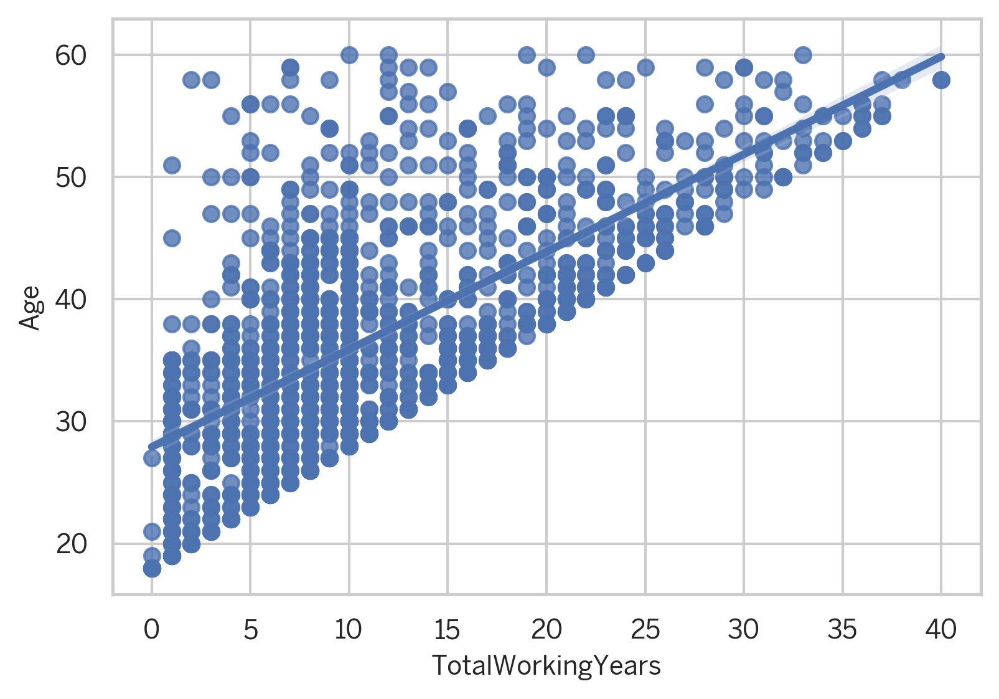

In [39]:
plt.figure(figsize = (6, 4))
sns.regplot(x = 'TotalWorkingYears', y = 'Age', data = df)
plt.show()

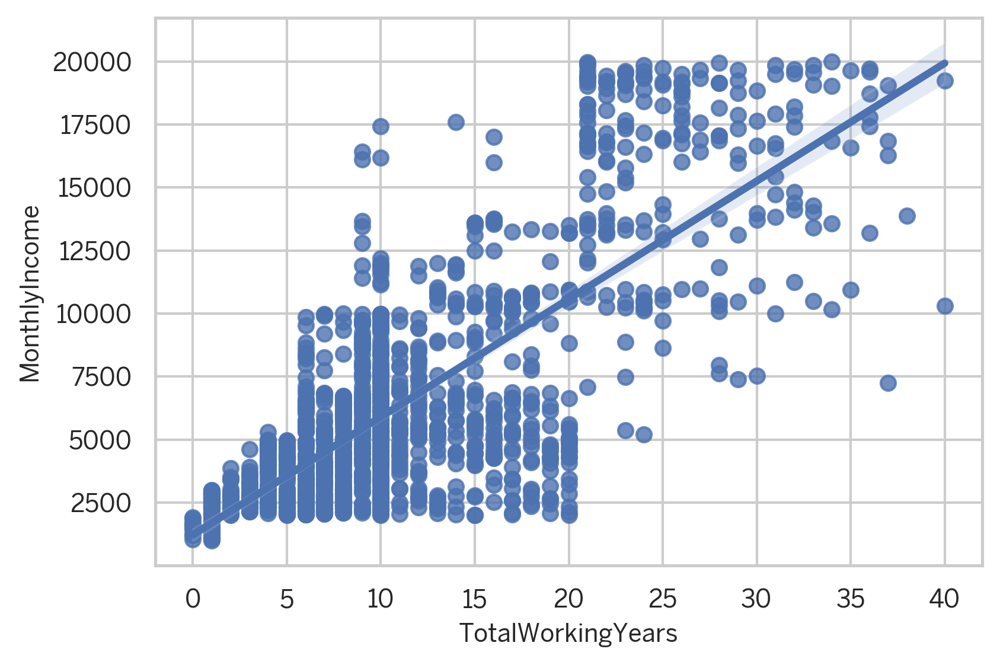

In [40]:
plt.figure(figsize = (6, 4))
sns.regplot(x = 'TotalWorkingYears', y = 'MonthlyIncome', data = df)
plt.show()

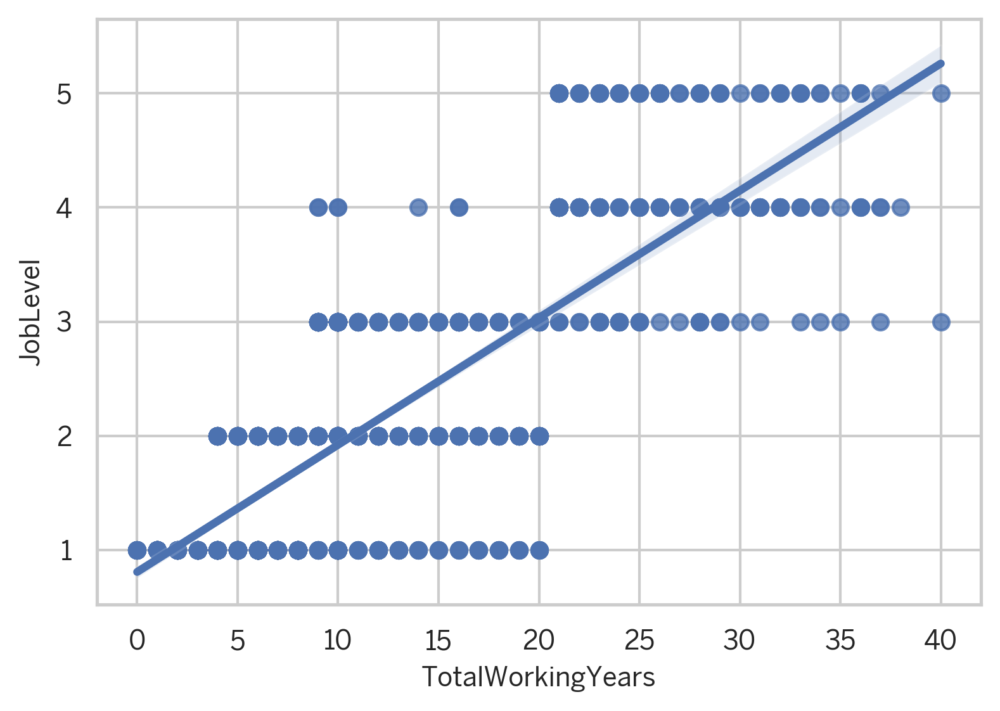

In [41]:
plt.figure(figsize = (6, 4))
sns.regplot(x = 'TotalWorkingYears', y = 'JobLevel', data = df)
plt.show()

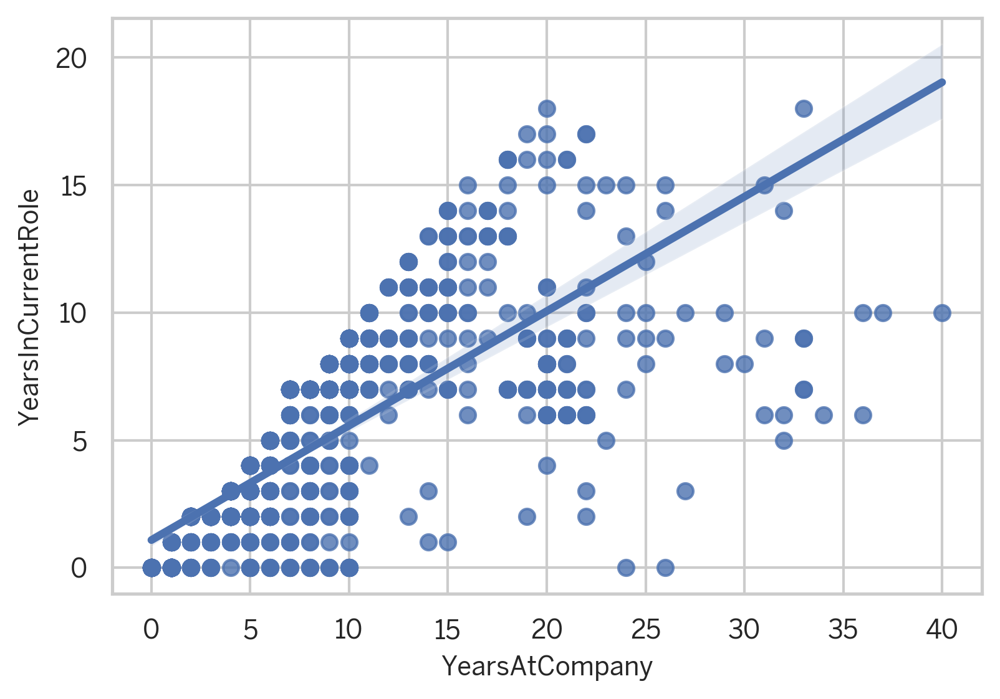

In [42]:
plt.figure(figsize = (6, 4))
sns.regplot(x = 'YearsAtCompany', y = 'YearsInCurrentRole', data = df)
plt.show()

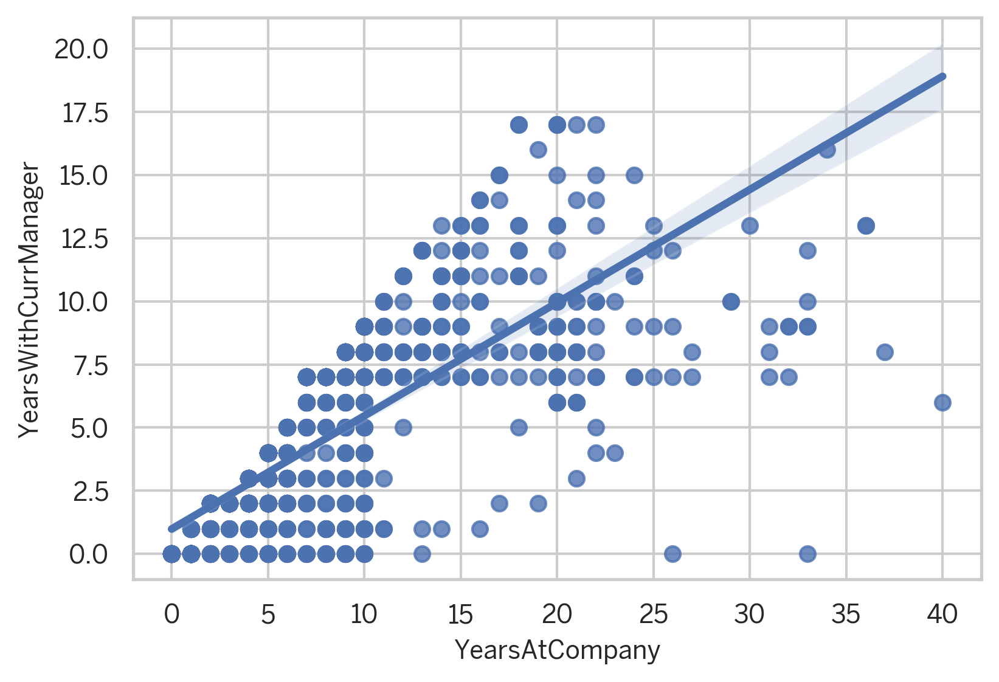

In [43]:
plt.figure(figsize = (6, 4))
sns.regplot(x = 'YearsAtCompany', y = 'YearsWithCurrManager', data = df)
plt.show()

Observations from Multivariate Analysis:

* Salary has a great influence on the employee's performance
* The longer employees work in the company, the more pay they will get
* Most employees who are in the higher position have worked for the company for a long time



#### Attrition Num of Each Quantitative Feature (KDE Plot)

In [44]:
# check the sum of numeric data + categorical ordinal
print(f"The amount of quantitative data = {len(quant)}")

The amount of quantitative data = 16


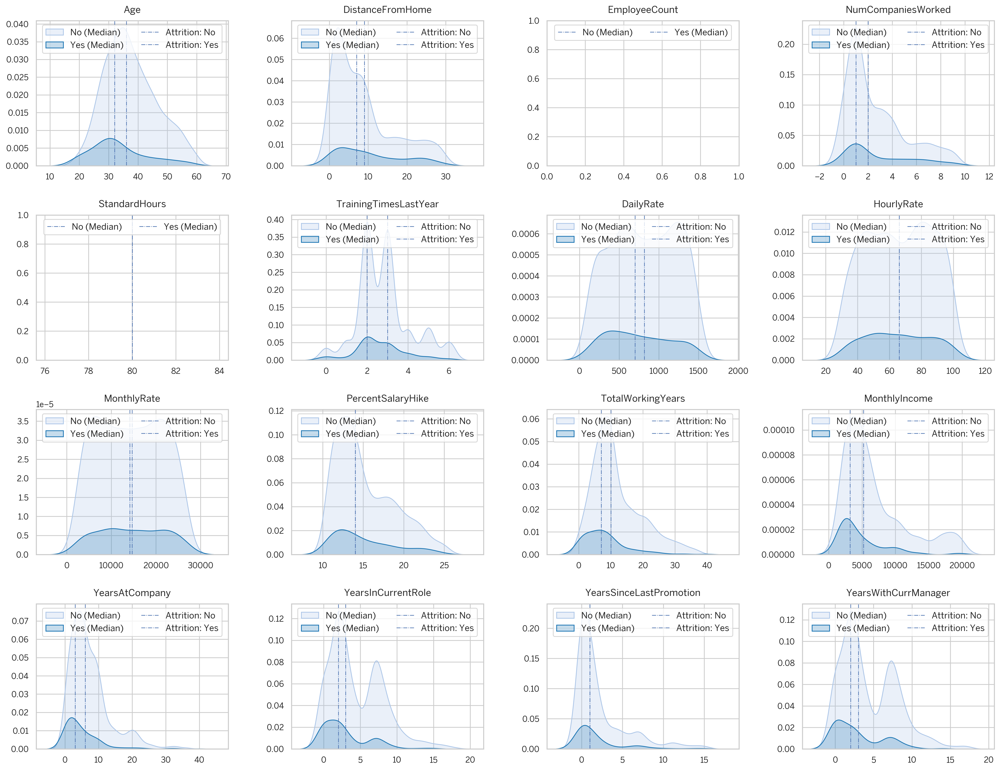

In [45]:
plt.figure(figsize = (18, 14))

for i in range(0, len(quant)):
    plt.subplot(4, 4, i+1)
    sns.kdeplot(x = quant[i], hue = 'Attrition', data = df, palette = 'tab20', linewidth = 1, fill = True, legend = True)

    plt.axvline(df[quant[i]].loc[df['Attrition'] == 'No'].median(), linewidth = 0.8, linestyle = '-.', label = 'No')
    plt.axvline(df[quant[i]].loc[df['Attrition'] == 'Yes'].median(), linewidth = 0.8, linestyle = '-.', label = 'Yes')

    plt.title(quant[i], fontsize = 12)
    plt.xlabel('')
    plt.ylabel('')
    plt.legend(['No (Median)', 'Yes (Median)', 'Attrition: No', 'Attrition: Yes',], ncol = 2, loc = 'upper center')

plt.tight_layout(pad = 2.0)
plt.show()

#### Attrition Num & Rate of Each Qualitative Feature (Bar Plot)

In [46]:
# check the amount of qualitative data
print(f"The amount of qualitative data = {len(qual)-1}") # except attrition

The amount of qualitative data = 18


In [47]:
plt.figure(figsize = (30, 20))

k = 0
for i in range(1, len(qual)):
    # attrition num
    plt.subplot(9, 4, i+k)
    sns.countplot(x = qual[i], hue = 'Attrition', data = df_qual, palette = 'tab20', orient = 'v')

    plt.title(f"{qual[i]}: Attrition Num", fontsize = 14)
    plt.xlabel('')
    plt.ylabel('')

    # attrition rate
    df_temp = df_qual.groupby([qual[i], 'Attrition']).size().reset_index().rename({0 : 'Size'}, axis = 1)
    df_temp['TotalSize'] = df_temp.groupby([qual[i]])['Size'].transform(sum)
    df_temp['AttritionRate'] = df_temp['Size'] / df_temp['TotalSize']

    df_temp = df_temp.loc[df_temp['Attrition'] == 'Yes'].reset_index(drop = True)
    df_temp = df_temp.sort_values(by = 'AttritionRate', ascending = False)

    plt.subplot(9, 4, i+k+1)
    sns.barplot(y = qual[i], x = 'AttritionRate', data = df_temp, palette = 'tab20', orient = 'h')

    plt.title(f"{qual[i]}: Attrition Rate", fontsize = 14)
    plt.xlabel('')
    plt.ylabel('')
    plt.xlim(0.0, 0.5)

    k += 1
plt.xticks(rotation=45, ha='right')
plt.tight_layout(w_pad = 0.5)
plt.show()

##**Diagnostic Analytics Observations**

**Career Progression**

**Attributes:** `JobLevel`, `PerformanceRating`, `TotalWorkingYears`, `TrainingTimesLastYear`, `YearsAtCompany`, `YearsInCurrentRole`, `YearsSinceLastPromotion`

**Observations:**
* It is not uncommon for employees who have only worked at the company (`YearsAtCompany`) for a few years (0-5 years) to decide to leave the company, compared to those who have worked for more than 10 years and remain at the company.


####**Compensation and Benefits**

**Attributes:** `DailyRate`, `HourlyRate`, `MonthlyIncome`, `MonthlyRate`, `PercentSalaryHike`, `StockOptionLevel`

**Observations:**
* The salary distribution (hourly/daily/monthly rate) of employees who leave the company is not much different from employees who remain, meaning it is not an important factor as a reason to leave the company.
* Employees who have monthly income which tends to be low (USD 0-5,000) decide to leave the company.



#### **Demographic Factors**

**Attributes:** `Age`, `Education`, `EducationField`, `Gender`, `MaritalStatus`, `NumCompaniesWorked`, `Over18`

**Observations:**
* Employees who leave the company tend to be younger (20-35 years) than employees who remain.
* More men leave the company than women, namely around 150 people.
* Employees with single status have a fairly high attrition rate and number compared to married and divorce.




#### **Job Satisfaction**

**Attributes:** `JobInvolvement`, `JobRole`, `JobSatisfaction`, `RelationshipSatisfaction`

**Observations:**
* The turnover tendency of Sales Representative is very high compared to other roles, followed by Laboratory Technician and Human Resources.
* The higher the job involvement (job involvement), the lower the attrition rate.



#### **Managerial Influence**
**Attribute:** `YearsWithCurrManager`
**Observations:**
* We could not observe any specific pattern with respect to this attribute.

#### **Work Environment**

**Attributes:** `BusinessTravel`, `Department`, `DistanceFromHome` ,`EmployeeCount`, `EnvironmentSatisfaction`, `OverTime`, `StandardHours`
, `WorkLifeBalance`

**Observations:**

* Around 150 employees who frequently travel on business tend to choose to leave the company, where the attrition rate is the highest compared to employees who rarely and do not travel on business.
* Sales Department has the highest attrition rate, namely 20%, but in terms of numbers there are more employees in the R&D Department. (meaning more cost is incurred to carry out turnover in that department)
* Human Resources has the lowest number of attrition in terms of number of employees.
* Employees who do overtime, have a fairly high attrition rate, amounting to 30% or 3x as much as those who don't. (meaning it is very detrimental in terms of cost to do turnover)
* Employees who have low satisfaction with the work environment (`EnvironmentSatisfaction`) have a fairly high attrition rate.
* There may be a relationship between Travel Frequently, Sales Representative, and Overtime.


##Feature Engineering

### Create New Features

In [48]:
# Add "Group Age" Feature
df_clean['GroupAge'] = np.where(df_clean['Age'] <= 30, '18-30',
                                np.where((df_clean['Age'] > 30) & (df_clean['Age'] <= 40), '31-40',
                                         np.where((df_clean['Age'] > 40) & (df_clean['Age'] <= 50), '41-50', '51-60')))
df_clean[['Age', 'GroupAge']]

,Age,GroupAge
0,41,41-50
1,49,41-50
2,37,31-40
3,33,31-40
4,27,18-30
...,...,...
1465,36,31-40
1466,39,31-40
1467,27,18-30
1468,49,41-50


In [49]:
# Median Monthly Income By Job Level
MedIncome = df_clean.groupby(['JobLevel'])['MonthlyIncome'].median()
MedIncome

JobLevel
1     2661.5
2     5343.0
3     9852.0
4    15992.0
5    19174.0
Name: MonthlyIncome, dtype: float64

In [50]:
# Add Feature Median Monthly Income By Job Level (below == 1, above == 0)
df_clean['BelowMedIncome'] = df_clean['JobLevel'].apply(lambda x: MedIncome[x])
df_clean['BelowMedIncome'] = np.where(df_clean['MonthlyIncome'] < df_clean['BelowMedIncome'], 1, 0)

In [51]:
# added group age (18-30) & overtime (yes) features
df_clean['GroupAge_Overtime'] = np.where((df_clean['GroupAge'] == '18-30') & (df_clean['OverTime'] == 'Yes'), 1, 0)

# added job level (1) & overtime (yes) features
df_clean['JobLevel_Overtime'] = np.where((df_clean['JobLevel'] == 1) & (df_clean['OverTime'] == 'Yes'), 1, 0)

# added job level (1) & below median monthly income (1) & overtime (yes)
df_clean['JobLevel_BelowMedIncome_Overtime'] = np.where((df_clean['JobLevel'] == 1) & (df_clean['BelowMedIncome'] == 1) & (df_clean['OverTime'] == 'Yes'), 1, 0)

In [52]:
df_clean

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,GroupAge,BelowMedIncome,GroupAge_Overtime,JobLevel_Overtime,JobLevel_BelowMedIncome_Overtime
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5,41-50,0,0,0,0
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,No,23,4,4,1,10,3,3,10,7,1,7,41-50,1,0,0,0
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Yes,15,3,2,0,7,3,3,0,0,0,0,31-40,1,0,1,1
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Yes,11,3,3,0,8,3,3,8,7,3,0,31-40,0,0,1,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,No,12,3,4,1,6,3,3,2,2,2,2,18-30,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,3,Male,41,4,2,Laboratory Technician,4,Married,2571,12290,4,No,17,3,3,1,17,3,3,5,2,0,3,31-40,1,0,0,0
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,4,Male,42,2,3,Healthcare Representative,1,Married,9991,21457,4,No,15,3,1,1,9,5,3,7,7,1,7,31-40,0,0,0,0
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2,Male,87,4,2,Manufacturing Director,2,Married,6142,5174,1,Yes,20,4,2,1,6,0,3,6,2,0,3,18-30,0,1,0,0
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,4,Male,63,2,2,Sales Executive,2,Married,5390,13243,2,No,14,3,4,0,17,3,2,9,6,0,8,41-50,0,0,0,0


### Normalization/Standardization (Z-Score Method)



Perform standardization if the numeric feature has a normal distribution, if not, then use normalization.

In [53]:
# save data for simulation
df_simulation = df_clean.copy()
df_simulation.to_csv(f"{gd_path}/dataset/data_valid_all_sim.csv", index = False)

In [54]:
# standardization scaling using StandardScaler
# Using fit_transform on the scaler object.
# This method both calculates the mean and standard deviation of the data (fit)
# and then transforms the data by subtracting the mean and dividing by the standard deviation (transform).

std_cols = ['Age']
for col in std_cols:
    x = df_clean[col].values.reshape(len(df_clean), 1)
    scaler = StandardScaler()
    x_scaled = scaler.fit_transform(x)
    df_clean[col] = x_scaled

# normalization scaling using MinMaxScalaer
# Similar to standardization, extracting values, reshapes them, and creates a scaler object.
# In this case, a MinMaxScaler is used.
# MinMaxScaler scales the data to a specific range, typically between 0 and 1.
# It uses fit_transform to calculate the minimum and maximum values (fit) and then scales each data point to the new range (transform).

nrm_cols = ['DailyRate', 'DistanceFromHome', 'HourlyRate', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']
for col in nrm_cols:
    x = df_clean[col].values.reshape(len(df_clean), 1)
    scaler = MinMaxScaler()
    x_scaled = scaler.fit_transform(x)
    df_clean[col] = x_scaled

df_clean[std_cols + nrm_cols].head(10)

,Age,DailyRate,DistanceFromHome,HourlyRate,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.536681,0.716332,0.000000,0.914286,0.263230,0.698016,0.888889,0.000000,0.235294,0.000000,0.24,0.266667,0.000000,0.357143
1,1.442111,0.126791,0.250000,0.442857,0.217651,0.915991,0.111111,0.857143,0.294118,0.500000,0.40,0.466667,0.090909,0.500000
2,0.083966,0.910458,0.035714,0.885714,0.057093,0.012007,0.666667,0.285714,0.205882,0.500000,0.00,0.000000,0.000000,0.000000
3,-0.368749,0.924069,0.071429,0.371429,0.100349,0.845796,0.111111,0.000000,0.235294,0.500000,0.32,0.466667,0.272727,0.000000
4,-1.047821,0.350287,0.035714,0.142857,0.129872,0.583688,1.000000,0.071429,0.176471,0.500000,0.08,0.133333,0.181818,0.142857
5,-0.481928,0.646848,0.035714,0.700000,0.108746,0.392217,0.000000,0.142857,0.235294,0.333333,0.28,0.466667,0.272727,0.428571
6,2.573899,0.875358,0.071429,0.728571,0.087726,0.315918,0.444444,0.642857,0.352941,0.500000,0.04,0.000000,0.000000,0.000000
7,-0.708285,0.899713,0.821429,0.528571,0.088941,0.451289,0.111111,0.785714,0.029412,0.333333,0.04,0.000000,0.000000,0.000000
8,0.197145,0.081662,0.785714,0.200000,0.449826,0.268653,0.000000,0.714286,0.294118,0.333333,0.36,0.466667,0.090909,0.571429
9,-0.029213,0.857450,0.928571,0.914286,0.223302,0.581479,0.666667,0.142857,0.500000,0.500000,0.28,0.466667,0.636364,0.500000


### Feature Encoding

*Determine the categorical features that need to be labeled normally (0, 1, etc.) or by one-hot encoding.*









In [55]:
# traditional labeling
label_cols = ['Attrition', 'OverTime', 'Gender', 'PerformanceRating']
df_clean['Attrition'] = df_clean['Attrition'].map({'No' : 0, 'Yes' : 1})
df_clean['OverTime'] = df_clean['OverTime'].map({'No' : 0, 'Yes' : 1})
df_clean['Gender'] = df_clean['Gender'].map({'Female' : 0, 'Male' : 1})
df_clean['PerformanceRating'] = df_clean['PerformanceRating'].map({3 : 0, 4 : 1}) # only consist of 2 unique values

# one-hot encoding
onehot_cols = ['BusinessTravel', 'Department', 'EducationField', 'JobRole', 'MaritalStatus', 'Education', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'RelationshipSatisfaction', 'StockOptionLevel', 'WorkLifeBalance', 'GroupAge']
result_cols = []
for col in onehot_cols:
    onehot = pd.get_dummies(df_clean[col], prefix = col)
    dummies_cols = list(onehot.columns)
    result_cols = result_cols + dummies_cols
    df_clean = df_clean.join(onehot)
df_clean = df_clean.drop(onehot_cols, axis = 1)

df_clean[label_cols + result_cols].head()

,Attrition,OverTime,Gender,PerformanceRating,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,...,JobLevel_1,JobLevel_2,JobLevel_3,JobLevel_4,JobLevel_5,JobSatisfaction_1,JobSatisfaction_2,JobSatisfaction_3,JobSatisfaction_4,RelationshipSatisfaction_1,RelationshipSatisfaction_2,RelationshipSatisfaction_3,RelationshipSatisfaction_4,StockOptionLevel_0,StockOptionLevel_1,StockOptionLevel_2,StockOptionLevel_3,WorkLifeBalance_1,WorkLifeBalance_2,WorkLifeBalance_3,WorkLifeBalance_4,GroupAge_18-30,GroupAge_31-40,GroupAge_41-50,GroupAge_51-60
0,1,1,0,0,False,False,True,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,...,False,True,False,False,False,False,False,False,True,True,False,False,False,True,False,False,False,True,False,False,False,False,False,True,False
1,0,0,1,1,False,True,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,...,False,True,False,False,False,False,True,False,False,False,False,False,True,False,True,False,False,False,False,True,False,False,False,True,False
2,1,1,1,0,False,False,True,False,True,False,False,False,False,False,True,False,False,False,True,False,False,False,False,False,False,...,True,False,False,False,False,False,False,True,False,False,True,False,False,True,False,False,False,False,False,True,False,False,True,False,False
3,0,1,0,0,False,True,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,...,True,False,False,False,False,False,False,True,False,False,False,True,False,True,False,False,False,False,False,True,False,False,True,False,False
4,0,0,1,0,False,False,True,False,True,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,...,True,False,False,False,False,False,True,False,False,False,False,False,True,False,True,False,False,False,False,True,False,True,False,False,False


### Split Unseen Data

In [56]:
x = df_clean.drop(['Attrition'], axis = 1) # features
y = df_clean[['Attrition']] # target

# train = training data for modeling
# test = unseen data for validation
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.1, random_state = 42)

In [57]:
df_clean = pd.DataFrame(y_train).join(x_train)
df_unseen = pd.DataFrame(y_test).join(x_test)

print(df_clean.shape)
print(df_unseen.shape)

(1248, 84)
(139, 84)


In [58]:
df_clean['Attrition'].value_counts()

Attrition
0    1051
1     197
Name: count, dtype: int64

Clean Data [Attrition] Attribute Counts:
* 0 = 1051 counts
* 1 = 197 counts

In [59]:
df_unseen['Attrition'].value_counts()

Attrition
0    107
1     32
Name: count, dtype: int64

Unseen data [Attrition] Attribute Counts:
* 0 = 107 counts
* 1 = 32 counts

### Feature Selection

*Select which features are needed for modeling based on EDA observations or other considerations such as experience.*

In [60]:
df_selection = df_clean.copy()

In [61]:
x = df_selection.drop(['Attrition', 'GroupAge_18-30', 'GroupAge_31-40', 'GroupAge_41-50', 'GroupAge_51-60', 'BelowMedIncome', 'GroupAge_Overtime', 'JobLevel_Overtime', 'JobLevel_BelowMedIncome_Overtime'], axis = 1) # all features exclude new features
y = df_selection[['Attrition']] # target

# fitting the data
# ExtraTreesClassifier implements a meta estimator that fits a number of randomized decision trees
# (a.k.a. extra-trees) on various sub-samples of the dataset
# and uses averaging to improve the predictive accuracy and control over-fitting.
model = ExtraTreesClassifier(random_state = 42)
model.fit(x, y)
result = model.feature_importances_

# convert to dataframe
feat_importances = pd.DataFrame({'Feature' : x.columns, 'Importance' : result})
feat_importances['Feature_Display'] = feat_importances['Feature'].apply(lambda x: " ".join(re.findall('[A-Z][^A-Z]*', x)))
feat_importances['Feature_Display'] = feat_importances['Feature_Display'].apply(lambda x: x.replace("_", ": "))
feat_importances

,Feature,Importance,Feature_Display
0,Age,0.028026,Age
1,DailyRate,0.018761,Daily Rate
2,DistanceFromHome,0.023421,Distance From Home
3,Gender,0.013839,Gender
4,HourlyRate,0.020784,Hourly Rate
...,...,...,...
70,StockOptionLevel_3,0.007303,Stock Option Level: 3
71,WorkLifeBalance_1,0.010921,Work Life Balance: 1
72,WorkLifeBalance_2,0.015137,Work Life Balance: 2
73,WorkLifeBalance_3,0.014842,Work Life Balance: 3


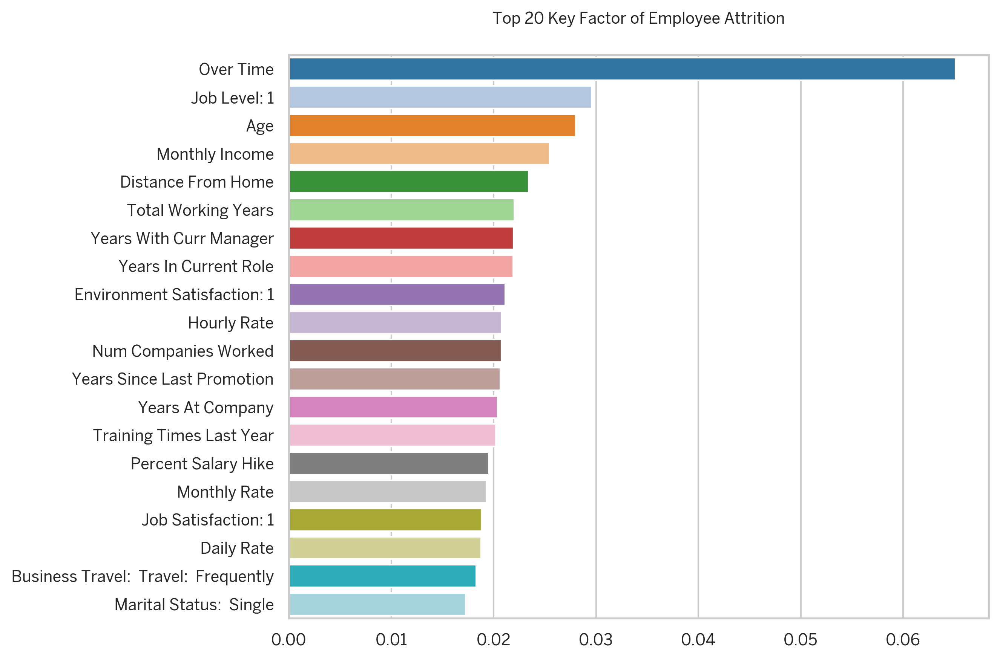

In [62]:
# set plot size
plt.figure(figsize = (9, 6))

# plotting the feature importances
data = feat_importances.sort_values(['Importance'], ascending = False).iloc[:20] # top 20
sns.barplot(y = 'Feature_Display', x = 'Importance', data = data, palette = 'tab20')
plt.title('Top 20 Key Factor of Employee Attrition', fontweight = 'bold', pad = 20)
plt.xlabel('') # clear label
plt.ylabel('') # clear label

plt.tight_layout()
plt.show()

Overtime is very important in considering employee attrition, very different from other features.

We will create a model to predict employee attrition with features that have a feature importance scale greater than 0.02.

And added features:
- `Department_Sales`
- `Department_ResearchAndDevelopment`
- `Department_HumanResources`
- `JobSatisfaction_1`
- `RelationshipSatisfaction_1`

In [63]:
# Create a list selected_features containing features with importance greater than or equal to 0.02 based on the analysis.
# Define two additional lists add_features1 and add_features2 containing specific features to be included
# regardless of their importance score (potentially based on domain knowledge or previous feature selection methods).

# filtering features
selected_features = list(feat_importances.loc[feat_importances['Importance'] >= 0.02]['Feature'])
add_features1 = ['Department_Sales', 'Department_Research & Development', 'Department_Human Resources', 'JobSatisfaction_1', 'RelationshipSatisfaction_1']
add_features2 = ['GroupAge_18-30', 'GroupAge_31-40', 'GroupAge_41-50', 'GroupAge_51-60', 'BelowMedIncome', 'GroupAge_Overtime', 'JobLevel_Overtime', 'JobLevel_BelowMedIncome_Overtime']

In [64]:
# clean data and validation of all features
df_clean_all = df_clean.copy()
df_valid_all = df_unseen.copy()

# clean and validated data containing feature importance > 0.02 and additional group agreement features
df_clean_selected = df_clean[['Attrition']].join(df_clean[selected_features + add_features1])
df_valid_selected = df_unseen[['Attrition']].join(df_unseen[selected_features + add_features1])

# clean and validated data containing feature importance > 0.02, additional group agreement features, and additional new features (group age, etc.)
df_clean_selected_new = df_clean[['Attrition']].join(df_clean[selected_features + add_features1 + add_features2])
df_valid_selected_new = df_unseen[['Attrition']].join(df_unseen[selected_features + add_features1 + add_features2])

In [65]:
# check categorical data type
df[qual].dtypes

Attrition                   object
BusinessTravel              object
Department                  object
EducationField              object
EmployeeNumber               int64
Gender                      object
JobRole                     object
MaritalStatus               object
Over18                      object
OverTime                    object
Education                    int64
EnvironmentSatisfaction      int64
JobInvolvement               int64
JobLevel                     int64
JobSatisfaction              int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StockOptionLevel             int64
WorkLifeBalance              int64
dtype: object

In [66]:
df['Department'].value_counts()

Department
Research & Development    961
Sales                     446
Human Resources            63
Name: count, dtype: int64

In [67]:
df_imp = df.copy()

df_imp['BusinessTravel'] = df_imp['BusinessTravel'].map({'Non-Travel' : 0, 'Travel_Rarely' : 1, 'Travel_Frequently' : 2})
df_imp['Gender'] = df_imp['Gender'].map({'Male' : 0, 'Female' : 1})
df_imp['OverTime'] = df_imp['OverTime'].map({'No' : 0, 'Yes' : 1})
df_imp['MaritalStatus'] = df_imp['MaritalStatus'].map({'Single' : 0, 'Married' : 1, 'Divorced' : 2})

df_imp['EducationField'] = df_imp['EducationField'].astype('category').cat.codes
df_imp['JobRole'] = df_imp['JobRole'].astype('category').cat.codes

df_imp = df_imp.drop(['Over18', 'EmployeeNumber'], axis = 1)

In [68]:
# check data type after encoding
df_imp.dtypes

Age                          int64
Attrition                   object
BusinessTravel               int64
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField                int8
EmployeeCount                int64
EnvironmentSatisfaction      int64
Gender                       int64
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                       int8
JobSatisfaction              int64
MaritalStatus                int64
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
OverTime                     int64
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears            int64
TrainingTimesLastYear        int64
WorkLifeBalance     

In [69]:
# may not be required in final drop
df_imp['Department'].nunique()

3

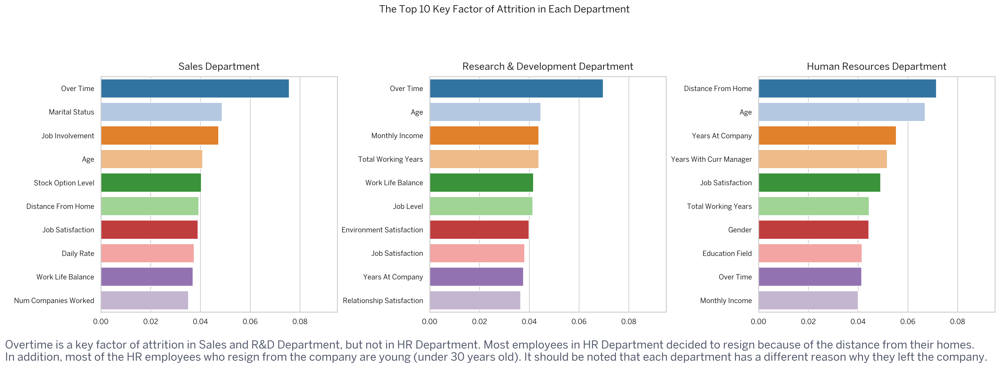

In [70]:
# may not be required in final drop
dept_unique = df_imp['Department'].unique()

fig = plt.figure(figsize = (20, 6))

for i in range(0, len(dept_unique)):
    x = df_imp.loc[df_imp['Department'] == dept_unique[i]].drop(['Attrition', 'Department'], axis = 1) # feature
    y = df_imp.loc[df_imp['Department'] == dept_unique[i]]['Attrition'] # target

    feat_importance = ExtraTreesClassifier().fit(x, y).feature_importances_

    feat_imp = pd.DataFrame({'column' : x.columns, 'value' : feat_importance}).sort_values('value', ascending = False).reset_index(drop = True)
    feat_imp['column'] = feat_imp['column'].apply(lambda x: " ".join(re.findall('[A-Z][^A-Z]*', x)))

    plt.subplot(1, 3, i+1)
    sns.barplot(y = 'column', x = 'value', data = feat_imp.iloc[0:10], palette = 'tab20')

    plt.title(f"{df_imp['Department'].unique()[i]} Department", fontweight = 'bold', fontsize = 14)
    plt.xlabel('')
    plt.ylabel('')
    plt.xlim(0.0, 0.095)

fig.suptitle("The Top 10 Key Factor of Attrition in Each Department", fontweight = 'bold', y = 1.1)
fig.text(x = 0, y = -0.05, s = "Overtime is a key factor of attrition in Sales and R&D Department, but not in HR Department. Most employees in HR Department decided to resign because of the distance from their homes. \nIn addition, most of the HR employees who resign from the company are young (under 30 years old). It should be noted that each department has a different reason why they left the company.", ha = 'left', va = 'center_baseline', color = '#555b6e', fontsize = 16)

fig.tight_layout(w_pad = 0.5)

fig.show()

## Export Clean Dataset

In [71]:
# save the cleaned data (ready to model)

fname_all = 'dataset/data_clean_all.csv'
fname_selected = 'dataset/data_clean_selected.csv'
fname_selected_new = 'dataset/data_clean_selected_new.csv'

fnames = [fname_all, fname_selected, fname_selected_new]
df_export = [df_clean_all, df_clean_selected, df_clean_selected_new]

for x_fname, y_df in zip(fnames, df_export):
    fname = f"{gd_path}/{x_fname}"
    y_df.to_csv(fname, index = False)

In [72]:
# save unseen data

fname_all = 'dataset/data_valid_all.csv'
fname_selected = 'dataset/data_valid_selected.csv'
fname_selected_new = 'dataset/data_valid_selected_new.csv'

fnames = [fname_all, fname_selected, fname_selected_new]
df_export = [df_valid_all, df_valid_selected, df_valid_selected_new]

for x_fname, y_df in zip(fnames, df_export):
    fname = f"{gd_path}/{x_fname}"
    y_df.to_csv(fname, index = False)

**Taking glance at Columns and Data Types**

In [73]:
# Let's see the list of columns
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

# **MODELLING THE DATA** *(M OF OSEMN)*

##PREDICTIVE ANALYTICS

### Intial Work To Create Variables To Store Classification Metrics

This `class_report` function provides a clear and concise way to organize and present the performance of a classification model on both training and testing data.

It allows for easy comparison of following metrics and helps in understanding potential overfitting or underfitting issues.

Calculate various classification metrics for the training & testing data:
* Accuracy using `accuracy_score`
* Precision using `precision_score`
* Recall using `recall_score`
* F1-score using `f1_score`
* Area Under the ROC Curve (AUC) using `roc_auc_score`


In [74]:
# classification report in dataframe
def class_report():

    # training score
    train_accuracy = accuracy_score(y_train, y_pred_train) # In multilabel classification, sklearn.metrics = accuracy_score() function computes subset accuracy, The best performance is 1
    train_precision = precision_score(y_train, y_pred_train) # sklearn.metrics = precision_score() function computes precision, the best value is 1 and the worst value is 0.
    train_recall = recall_score(y_train, y_pred_train) # sklearn.metrics = recall_score() function computes recall, the best value is 1 and the worst value is 0.
    train_f1 = f1_score(y_train, y_pred_train) # Compute the F1 score, also known as balanced F-score or F-measure.
    train_auc = roc_auc_score(y_train, y_pred_train) # Compute Area Under the Receiver Operating Characteristic Curve (ROC AUC) from prediction scores.


    # testing score
    test_accuracy = accuracy_score(y_test, y_pred_test)
    test_precision = precision_score(y_test, y_pred_test)
    test_recall = recall_score(y_test, y_pred_test)
    test_f1 = f1_score(y_test, y_pred_test)
    test_auc = roc_auc_score(y_test, y_pred_test)

    # create dataframe
    train_score = [train_accuracy, train_precision, train_recall, train_f1, train_auc]
    test_score = [test_accuracy, test_precision, test_recall, test_f1, test_auc]
    data = {'Training' : train_score, 'Testing' : test_score}
    index = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC']
    df_report = pd.DataFrame(data = data, index = index)
    df_report['Difference'] = df_report['Training'] - df_report['Testing']
    df_report['Average'] = (df_report['Training'] + df_report['Testing']) / 2

    return df_report

In [75]:
# # clean dataset
# df_clean1 = pd.read_csv(gd_path + 'data_clean_all.csv')
# df_clean2 = pd.read_csv(gd_path + 'data_clean_selected.csv')
# df_clean3 = pd.read_csv(gd_path + 'data_clean_selected_new.csv')

# # validation (unseen) dataset
# df_valid1 = pd.read_csv(gd_path + 'data_valid_all.csv')
# df_valid2 = pd.read_csv(gd_path + 'data_valid_selected.csv')
# df_valid3 = pd.read_csv(gd_path + 'data_valid_selected_new.csv')

In [76]:
# clean dataset
df_clean1 = df_clean_all.copy()
df_clean2 = df_clean_selected.copy()
df_clean3 = df_clean_selected_new.copy()

# validation (unseen) dataset
df_valid1 = df_valid_all.copy()
df_valid2 = df_valid_selected.copy()
df_valid3 = df_valid_selected_new.copy()

In [77]:
dfs_clean = [df_clean1, df_clean2, df_clean3]
for idx, val in enumerate(dfs_clean):
    print(f"The number of rows and columns of df_clean{idx+1} : {val.shape}")

dfs_valid = [df_valid1, df_valid2, df_valid3]
for idx, val in enumerate(dfs_valid):
    print(f"The number of rows and columns of df_valid{idx+1} : {val.shape}")

The number of rows and columns of df_clean1 : (1248, 84)
The number of rows and columns of df_clean2 : (1248, 20)
The number of rows and columns of df_clean3 : (1248, 28)
The number of rows and columns of df_valid1 : (139, 84)
The number of rows and columns of df_valid2 : (139, 20)
The number of rows and columns of df_valid3 : (139, 28)


### Dataset 1:

### Train-Test Split

In [78]:
# training and testing data
# https://datascience.stackexchange.com/questions/15135/train-test-validation-set-splitting-in-sklearn

x_feature = df_clean1.drop(['Attrition'], axis = 1).values # features
y_target = df_clean1['Attrition'].values # y_target

x_train, x_test, y_train, y_test = train_test_split(x_feature, y_target, test_size = 0.3, random_state = 42) # 70:30

In [79]:
# validation data
x_valid = df_valid1.drop(['Attrition'], axis = 1).values # features
y_valid = df_valid1['Attrition'].values # target

In [80]:
df_clean

,Attrition,Age,DailyRate,DistanceFromHome,Gender,HourlyRate,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BelowMedIncome,GroupAge_Overtime,JobLevel_Overtime,JobLevel_BelowMedIncome_Overtime,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,...,JobLevel_1,JobLevel_2,JobLevel_3,JobLevel_4,JobLevel_5,JobSatisfaction_1,JobSatisfaction_2,JobSatisfaction_3,JobSatisfaction_4,RelationshipSatisfaction_1,RelationshipSatisfaction_2,RelationshipSatisfaction_3,RelationshipSatisfaction_4,StockOptionLevel_0,StockOptionLevel_1,StockOptionLevel_2,StockOptionLevel_3,WorkLifeBalance_1,WorkLifeBalance_2,WorkLifeBalance_3,WorkLifeBalance_4,GroupAge_18-30,GroupAge_31-40,GroupAge_41-50,GroupAge_51-60
846,0,-0.142391,0.513610,0.035714,1,0.200000,0.489331,0.702393,0.222222,0,0.500000,0,0.441176,0.333333,0.28,0.466667,0.545455,0.285714,0,0,0,0,False,False,True,...,False,False,True,False,False,False,True,False,False,False,True,False,False,False,True,False,False,False,False,False,True,False,True,False,False
929,0,-0.934643,0.065186,0.035714,1,0.314286,0.150945,0.486909,0.111111,1,0.071429,0,0.058824,0.333333,0.08,0.133333,0.181818,0.142857,0,1,1,0,False,True,False,...,True,False,False,False,False,False,False,False,True,False,True,False,False,False,True,False,False,False,False,True,False,True,False,False,False
206,0,-1.613715,0.740688,0.142857,1,0.428571,0.069663,0.413421,0.111111,1,0.357143,0,0.117647,0.333333,0.16,0.133333,0.181818,0.142857,1,1,1,1,False,False,True,...,True,False,False,False,False,False,True,False,False,True,False,False,False,False,True,False,False,False,True,False,False,True,False,False,False
1287,0,0.649860,0.734957,0.428571,1,0.928571,0.239199,0.144527,0.555556,0,0.500000,0,0.294118,0.333333,0.00,0.000000,0.000000,0.000000,0,0,0,0,False,False,True,...,False,True,False,False,False,True,False,False,False,False,False,True,False,False,False,True,False,False,True,False,False,False,False,True,False
1320,0,0.649860,0.181232,0.321429,1,0.114286,0.101775,0.163200,0.333333,0,0.785714,1,0.294118,0.166667,0.24,0.200000,0.272727,0.214286,0,0,0,0,True,False,False,...,True,False,False,False,False,False,False,True,False,False,True,False,False,False,False,True,False,False,True,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1164,0,0.423502,0.247851,0.535714,0,0.771429,0.366325,0.716850,0.666667,1,0.285714,0,0.529412,0.333333,0.16,0.133333,0.272727,0.214286,1,0,0,0,False,False,True,...,False,False,True,False,False,False,False,False,True,False,False,False,True,True,False,False,False,False,True,False,False,False,True,False,False
1200,0,0.876217,0.305158,0.000000,0,0.200000,0.115454,0.083126,0.444444,1,0.500000,0,0.235294,0.333333,0.08,0.133333,0.181818,0.142857,0,0,1,0,False,False,True,...,True,False,False,False,False,False,False,False,True,True,False,False,False,False,False,False,True,False,False,True,False,False,False,True,False
1374,0,2.460720,0.360315,0.714286,0,0.600000,0.890778,0.388081,0.444444,1,0.142857,0,0.852941,0.333333,0.04,0.000000,0.000000,0.000000,0,0,0,0,False,False,True,...,False,False,False,True,False,False,False,False,True,False,False,True,False,False,True,False,False,False,True,False,False,False,False,False,True
910,0,-1.500537,0.194126,0.000000,1,0.242857,0.011302,0.594490,0.111111,0,0.785714,1,0.029412,0.333333,0.04,0.000000,0.000000,0.071429,1,0,0,0,False,False,True,...,True,False,False,False,False,False,False,True,False,False,False,False,True,False,True,False,False,False,False,True,False,True,False,False,False


### Logistic Regression

#### Default Parameter

In [82]:
# Logistic Regression with Default Parameters
lr = LogisticRegression(random_state = 42)
lr.fit(x_train, y_train) # train the logistic regression model on the training data (x_train for features and y_train for target labels).

# prediction
y_pred_train = lr.predict(x_train) # predicts the class labels for the training data itself, using the trained model
y_pred_test = lr.predict(x_test) # predicts the class labels for unseen data

# calculate the f1 score (for training and unseen data)
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Default Parameter)")
print("============================")
print(f"Training : {f1_train:.2%} || Testing : {f1_test:.2%}")

F1 Score (Default Parameter)
Training : 63.93% || Testing : 57.14%


#### Hyperparameter Tuning

In [83]:
# define a grid of hyperparameter values to explore during tuning
params = {
    'penalty' : ['l1', 'l2', 'elasticnet'],
    'C' : [1, 5, 7, 9],
    'solver' : ['liblinear'],
}

# perform an exhaustive search over the specified hyperparameter combinations
lr_tune = GridSearchCV(lr, params, cv = 5, scoring = 'f1')
lr_tune.fit(x_train, y_train)

# prediction
y_pred_train = lr_tune.predict(x_train)
y_pred_test = lr_tune.predict(x_test)

# calculate f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Training Score : {f1_train:.2%} || Testing Score : {f1_test:.2%}")
print("")

# get the dictionary containing the best hyperparameter combination found during grid search
best = lr_tune.best_params_

print("Best Hyperparameter")
print("===================")
for key, val in best.items():
    if key == list(best.keys())[-1]:
        print(f"{key} : {val}")
    else:
        print(f"{key} : {val}", end = ' || ')

F1 Score (Hyperparameter Tuning)
Training Score : 68.12% || Testing Score : 55.24%

Best Hyperparameter
C : 5 || penalty : l1 || solver : liblinear


#### Validation

In [84]:
# predict validation data
y_pred_valid = lr_tune.predict(x_valid)
f1_valid = f1_score(y_valid, y_pred_valid)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Validation : {f1_valid:.2%}")

F1 Score (Hyperparameter Tuning)
Validation : 56.00%


In [85]:
# calculate various evaluation metrics for the model's performance on validation data
acc_valid = accuracy_score(y_valid, y_pred_valid)
prec_valid = precision_score(y_valid, y_pred_valid)
rec_valid = recall_score(y_valid, y_pred_valid)
f1_valid = f1_score(y_valid, y_pred_valid)
auc_valid = roc_auc_score(y_valid, y_pred_valid)

data = columns = {'Accuracy' : acc_valid, 'Precision' : prec_valid, 'Recall' : rec_valid, 'F1' : f1_valid, 'AUC' : auc_valid}

# store the evaluation metrics for the tuned logistic regression model
lr_report1 = pd.DataFrame(data, index = ['Logistic Regression (1)'])
lr_report1

,Accuracy,Precision,Recall,F1,AUC
Logistic Regression (1),0.841727,0.777778,0.4375,0.56,0.700058


### K-Nearest Neighbor

#### Deafault Parameter

In [86]:
# create a KNN classifier instance
knn = KNeighborsClassifier()
# train the KNN model on the training data
knn.fit(x_train, y_train)

# predict class labels for both training and test data
y_pred_train = knn.predict(x_train)
y_pred_test = knn.predict(x_test)

# calculate f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Default Parameter)")
print("============================")
print(f"Training : {f1_train:.2%} || Testing : {f1_test:.2%}")

F1 Score (Default Parameter)
Training : 43.93% || Testing : 30.95%


#### Hyperparameter Tuning

In [87]:
# define a grid of hyperparameter values to explore during tuning
params = {
    'n_neighbors' : [2, 3, 5, 7, 9, 10, 11, 12, 15],
    'weights' : ['uniform'],
    'algorithm' : ['kd_tree', 'ball_tree', 'brute'],
    'p' : [1, 2],
}

# perform an exhaustive search over the specified hyperparameter combinations
knn_tune = GridSearchCV(knn, params, cv = 5, scoring = 'f1')
knn_tune.fit(x_train, y_train)

# prediction
y_pred_train = knn_tune.predict(x_train)
y_pred_test = knn_tune.predict(x_test)

# calculate f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Training Score : {f1_train:.2%} || Testing Score : {f1_test:.2%}")
print("")

# get the dictionary containing the best hyperparameter combination found during grid search
best = knn_tune.best_params_

print("Best Hyperparameter")
print("===================")
for key, val in best.items():
    if key == list(best.keys())[-1]:
        print(f"{key} : {val}")
    else:
        print(f"{key} : {val}", end = ' || ')

F1 Score (Hyperparameter Tuning)
Training Score : 56.41% || Testing Score : 31.82%

Best Hyperparameter
algorithm : kd_tree || n_neighbors : 3 || p : 2 || weights : uniform


#### Validation

In [88]:
# predict validation data
y_pred_valid = knn_tune.predict(x_valid)
f1_valid = f1_score(y_valid, y_pred_valid)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Validation : {f1_valid:.2%}")

F1 Score (Hyperparameter Tuning)
Validation : 34.78%


In [89]:
# calculate various evaluation metrics for the model's performance on validation data
acc_valid = accuracy_score(y_valid, y_pred_valid)
prec_valid = precision_score(y_valid, y_pred_valid)
rec_valid = recall_score(y_valid, y_pred_valid)
f1_valid = f1_score(y_valid, y_pred_valid)
auc_valid = roc_auc_score(y_valid, y_pred_valid)

data = columns = {'Accuracy' : acc_valid, 'Precision' : prec_valid, 'Recall' : rec_valid, 'F1' : f1_valid, 'AUC' : auc_valid}

# store the evaluation metrics for the tuned knn model
knn_report1 = pd.DataFrame(data, index = ['K-Nearest Neighbor (1)'])
knn_report1

,Accuracy,Precision,Recall,F1,AUC
K-Nearest Neighbor (1),0.784173,0.571429,0.25,0.347826,0.596963


### Support Vector Machine

#### Default Parameter

In [90]:
svm = SVC(random_state = 42)
svm.fit(x_train, y_train)

y_pred_train = svm.predict(x_train)
y_pred_test = svm.predict(x_test)

# calculate accuarcy score for both train and test data
acc_train = accuracy_score(y_train, y_pred_train)
acc_test = accuracy_score(y_test, y_pred_test)

# calculate F1 Score
F1_train = f1_score(y_train, y_pred_train)
F1_test = f1_score(y_test, y_pred_test)

print("Accuracy (Default Parameter)")
print(f"Training : {acc_train:.2%} | Testing : {acc_test:.2%}")
print("F1 (Default Parameter)")
print(f"Training : {F1_train:.2%} | Testing : {F1_test:.2%}")

Accuracy (Default Parameter)
Training : 91.64% | Testing : 85.87%
F1 (Default Parameter)
Training : 62.18% | Testing : 36.14%


#### Hyperparameter Tuning

In [91]:
# define a grid of hyperparameter values to explore during tuning

C = list(np.arange(0.1, 1)) # penggunaan angka 1 adalah default dan mencari mana yang terbaik dengan kemungkinan array
kernel = ['sigmoid']
cache_size = list(np.arange(10))
gamma = list(np.arange(0.1, 1))

params = dict(
    C = C,
    kernel = kernel,
    cache_size = cache_size,
    gamma = gamma
)

# perform an exhaustive search over the specified hyperparameter combinations
svm_parameter = GridSearchCV(svm, params, cv = 5, scoring = 'f1')
svm_parameter.fit(x_train, y_train)

# prediction
y_pred_train = svm_parameter.predict(x_train)
y_pred_test = svm_parameter.predict(x_test)

# get the dictionary containing the best hyperparameter combination found during grid search
best = {}
for x in params.keys():
    best[x] = svm_parameter.best_estimator_.get_params()[x]
print(f"Best hyperparameter : {best}")

Best hyperparameter : {'C': 0.1, 'kernel': 'sigmoid', 'cache_size': 1, 'gamma': 0.1}


In [92]:
svm_train_report1 = class_report()
svm_train_report1

,Training,Testing,Difference,Average
Accuracy,0.848797,0.826667,0.022131,0.837732
Precision,0.000000,0.000000,0.000000,0.000000
Recall,0.000000,0.000000,0.000000,0.000000
F1,0.000000,0.000000,0.000000,0.000000
AUC,0.500000,0.500000,0.000000,0.500000


#### Validation

In [93]:
# predict validation data
y_pred_valid = svm_parameter.predict(x_valid)
acc_valid = accuracy_score(y_valid, y_pred_valid)
f1_valid = f1_score(y_valid, y_pred_valid)

print("Validation Score (Hyperparameter Tuning)")
print(f"Accuracy : {acc_valid:.2%}")
print(f"F1 : {f1_valid:.2%}")

Validation Score (Hyperparameter Tuning)
Accuracy : 76.98%
F1 : 0.00%


In [94]:
acc_valid = accuracy_score(y_valid, y_pred_valid)
prec_valid = precision_score(y_valid, y_pred_valid)
rec_valid = recall_score(y_valid, y_pred_valid)
f1_valid = f1_score(y_valid, y_pred_valid)
auc_valid = roc_auc_score(y_valid, y_pred_valid)

data = columns = {'Accuracy' : acc_valid, 'Precision' : prec_valid, 'Recall' : rec_valid, 'F1' : f1_valid, 'AUC' : auc_valid}

SVM_report1 = pd.DataFrame(data, index = ['Support Vector Machine (1)'])
SVM_report1

,Accuracy,Precision,Recall,F1,AUC
Support Vector Machine (1),0.769784,0.0,0.0,0.0,0.5


### Decision Tree

#### Default Parameter

In [95]:
dt = DecisionTreeClassifier(random_state = 42)
dt.fit(x_train, y_train)

# prediction
y_pred_train = dt.predict(x_train)
y_pred_test = dt.predict(x_test)

# f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Default Parameter)")
print("============================")
print(f"Training : {f1_train:.2%} || Testing : {f1_test:.2%}")

F1 Score (Default Parameter)
Training : 100.00% || Testing : 36.97%


#### Hyperparameter Tuning

In [96]:
# list of hyperparameters

params = {
    'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy"]
}

dt_tune = GridSearchCV(dt, params, cv = 5, scoring = 'f1')
dt_tune.fit(x_train, y_train)

# prediction
y_pred_train = dt_tune.predict(x_train)
y_pred_test = dt_tune.predict(x_test)

# f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Training Score : {f1_train:.2%} || Testing Score : {f1_test:.2%}")
print("")

# get best parameter
best = dt_tune.best_params_

print("Best Hyperparameter")
print("===================")
for key, val in best.items():
    if key == list(best.keys())[-1]:
        print(f"{key} : {val}")
    else:
        print(f"{key} : {val}", end = ' || ')

F1 Score (Hyperparameter Tuning)
Training Score : 46.83% || Testing Score : 33.71%

Best Hyperparameter
criterion : gini || max_depth : 3 || min_samples_leaf : 10


#### Validation

In [97]:
# predict validation data
y_pred_valid = dt_tune.predict(x_valid)
f1_valid = f1_score(y_valid, y_pred_valid)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Validation : {f1_valid:.2%}")

F1 Score (Hyperparameter Tuning)
Validation : 29.27%


In [98]:
# report validation data

acc_valid = accuracy_score(y_valid, y_pred_valid)
prec_valid = precision_score(y_valid, y_pred_valid)
rec_valid = recall_score(y_valid, y_pred_valid)
f1_valid = f1_score(y_valid, y_pred_valid)
auc_valid = roc_auc_score(y_valid, y_pred_valid)

data = columns = {'Accuracy' : acc_valid, 'Precision' : prec_valid, 'Recall' : rec_valid, 'F1' : f1_valid, 'AUC' : auc_valid}

dt_report1 = pd.DataFrame(data, index = ['Decision Tree (1)'])
dt_report1

,Accuracy,Precision,Recall,F1,AUC
Decision Tree (1),0.791367,0.666667,0.1875,0.292683,0.579731


### Random Forest

#### Default Parameter

In [99]:
RF = RandomForestClassifier(n_estimators = 10, random_state=42)
RF.fit(x_train, y_train)

# prediction
y_pred_train = RF.predict(x_train)
y_pred_test = RF.predict(x_test)

# f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Default Parameter)")
print("============================")
print(f"Training : {f1_train:.2%} || Testing : {f1_test:.2%}")

F1 Score (Default Parameter)
Training : 95.24% || Testing : 23.08%


#### Hyperparameter Tuning

In [100]:
# list of hyperparameters
params = {
     'criterion': ['gini','entropy'],
     'min_samples_leaf': [1,2,9],
     'min_samples_split': [30,50,70,130,131,132],
    'class_weight' : ['balanced_subsample']
}

RF_tune = RandomizedSearchCV(RF, params, cv = 5, scoring = 'f1', random_state = 42)
RF_tune.fit(x_train, y_train)

# prediction
y_pred_train = RF_tune.predict(x_train)
y_pred_test = RF_tune.predict(x_test)

# f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Training Score : {f1_train:.2%} || Testing Score : {f1_test:.2%}")
print("")

# get best parameter
best = RF_tune.best_params_

print("Best Hyperparameter")
print("===================")
for key, val in best.items():
    if key == list(best.keys())[-1]:
        print(f"{key} : {val}")
    else:
        print(f"{key} : {val}", end = ' || ')

F1 Score (Hyperparameter Tuning)
Training Score : 55.71% || Testing Score : 53.42%

Best Hyperparameter
min_samples_split : 132 || min_samples_leaf : 9 || criterion : gini || class_weight : balanced_subsample


#### Validation

In [101]:
# predict validation data
y_pred_valid = RF_tune.predict(x_valid)
f1_valid = f1_score(y_valid, y_pred_valid)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Validation : {f1_valid:.2%}")

F1 Score (Hyperparameter Tuning)
Validation : 52.05%


In [102]:
# report validation data

acc_valid = accuracy_score(y_valid, y_pred_valid)
prec_valid = precision_score(y_valid, y_pred_valid)
rec_valid = recall_score(y_valid, y_pred_valid)
f1_valid = f1_score(y_valid, y_pred_valid)
auc_valid = roc_auc_score(y_valid, y_pred_valid)

data = columns = {'Accuracy' : acc_valid, 'Precision' : prec_valid, 'Recall' : rec_valid, 'F1' : f1_valid, 'AUC' : auc_valid}

RF_report1 = pd.DataFrame(data, index = ['Random Forest (1)'])
RF_report1

,Accuracy,Precision,Recall,F1,AUC
Random Forest (1),0.748201,0.463415,0.59375,0.520548,0.694071


### XGBoost

#### Default Parameter

In [103]:
# fit model no training data
model = XGBClassifier(random_state = 42, eval_metric = 'logloss')
model.fit(x_train, y_train)

#prediction
y_pred_train = model.predict(x_train)
y_pred_test = model.predict(x_test)

# f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Default Parameter)")
print("============================")
print(f"Training : {f1_train:.2%} || Testing : {f1_test:.2%}")

F1 Score (Default Parameter)
Training : 100.00% || Testing : 46.15%


#### Hyperparameter Tuning

In [104]:
# list of hyperparameters
params = {
    'min_child_weight': [1, 5, 10],
    'gamma': [0.5, 1, 1.5, 2, 5],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'max_depth': [3, 4, 5]
}

model_tune = RandomizedSearchCV(model, params, n_iter = 30, cv = 5, scoring = 'f1', random_state = 42)
model_tune.fit(x_train, y_train)

# prediction
y_pred_train = model_tune.predict(x_train)
y_pred_test = model_tune.predict(x_test)

# f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Training Score : {f1_train:.2%} || Testing Score : {f1_test:.2%}")
print("")

# get best parameter
best = model_tune.best_params_

print("Best Hyperparameter")
print("===================")
for key, val in best.items():
    if key == list(best.keys())[-1]:
        print(f"{key} : {val}")
    else:
        print(f"{key} : {val}", end = ' || ')

F1 Score (Hyperparameter Tuning)
Training Score : 76.44% || Testing Score : 52.00%

Best Hyperparameter
subsample : 0.8 || min_child_weight : 10 || max_depth : 4 || gamma : 1.5 || colsample_bytree : 0.6


#### Validation

In [105]:
# predict validation data
y_pred_valid = model_tune.predict(x_valid)
f1_valid = f1_score(y_valid, y_pred_valid)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Validation : {f1_valid:.2%}")

F1 Score (Hyperparameter Tuning)
Validation : 48.98%


In [106]:
acc_valid = accuracy_score(y_valid, y_pred_valid)
prec_valid = precision_score(y_valid, y_pred_valid)
rec_valid = recall_score(y_valid, y_pred_valid)
f1_valid = f1_score(y_valid, y_pred_valid)
auc_valid = roc_auc_score(y_valid, y_pred_valid)

data = columns = {'Accuracy' : acc_valid, 'Precision' : prec_valid, 'Recall' : rec_valid, 'F1' : f1_valid, 'AUC' : auc_valid}

xgboost_report1 = pd.DataFrame(data, index = ['XGBoost (1)'])
xgboost_report1

,Accuracy,Precision,Recall,F1,AUC
XGBoost (1),0.820144,0.705882,0.375,0.489796,0.664136


## Dataset 2 (Selected Features)

### Train-Test Split

In [107]:
# training and testing data

x_feature = df_clean2.drop(['Attrition'], axis = 1).values # features
y_target = df_clean2['Attrition'].values # y_target

x_train, x_test, y_train, y_test = train_test_split(x_feature, y_target, test_size = 0.3, random_state = 42) # 70:30

In [108]:
# validation data

x_valid = df_valid2.drop(['Attrition'], axis = 1).values # features
y_valid = df_valid2['Attrition'].values # target

### Logistic Regression

#### Default Parameter

In [109]:
lr = LogisticRegression(random_state = 42)
lr.fit(x_train, y_train)

# prediction
y_pred_train = lr.predict(x_train)
y_pred_test = lr.predict(x_test)

# f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Default Parameter)")
print("============================")
print(f"Training : {f1_train:.2%} || Testing : {f1_test:.2%}")

F1 Score (Default Parameter)
Training : 40.66% || Testing : 37.65%


#### Hyperparameter Tuning

In [110]:
# list of hyperparameters
params = {
    'penalty' : ['l1', 'l2', 'elasticnet'],
    'C' : [2, 0.2, 0.002, 0.0002],
    'solver' : ['liblinear'],
}

lr_tune = GridSearchCV(lr, params, cv = 5, scoring = 'f1')
lr_tune.fit(x_train, y_train)

# prediction
y_pred_train = lr_tune.predict(x_train)
y_pred_test = lr_tune.predict(x_test)

# f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Training Score : {f1_train:.2%} || Testing Score : {f1_test:.2%}")
print("")

# get best parameter
best = lr_tune.best_params_

print("Best Hyperparameter")
print("===================")
for key, val in best.items():
    if key == list(best.keys())[-1]:
        print(f"{key} : {val}")
    else:
        print(f"{key} : {val}", end = ' || ')

F1 Score (Hyperparameter Tuning)
Training Score : 40.88% || Testing Score : 35.29%

Best Hyperparameter
C : 2 || penalty : l2 || solver : liblinear


#### Validation

In [111]:
# predict validation data
y_pred_valid = lr_tune.predict(x_valid)
f1_valid = f1_score(y_valid, y_pred_valid)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Validation : {f1_valid:.2%}")

F1 Score (Hyperparameter Tuning)
Validation : 25.00%


In [112]:
acc_valid = accuracy_score(y_valid, y_pred_valid)
prec_valid = precision_score(y_valid, y_pred_valid)
rec_valid = recall_score(y_valid, y_pred_valid)
f1_valid = f1_score(y_valid, y_pred_valid)
auc_valid = roc_auc_score(y_valid, y_pred_valid)

data = columns = {'Accuracy' : acc_valid, 'Precision' : prec_valid, 'Recall' : rec_valid, 'F1' : f1_valid, 'AUC' : auc_valid}

lr_report2 = pd.DataFrame(data, index = ['Logistic Regression (2)'])
lr_report2

,Accuracy,Precision,Recall,F1,AUC
Logistic Regression (2),0.784173,0.625,0.15625,0.25,0.564106


### K-Nearest Neighbor

#### Default Parameter

In [113]:
knn = KNeighborsClassifier()
knn.fit(x_train, y_train)

# prediction
y_pred_train = knn.predict(x_train)
y_pred_test = knn.predict(x_test)

# f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Default Parameter)")
print("============================")
print(f"Training : {f1_train:.2%} || Testing : {f1_test:.2%}")

F1 Score (Default Parameter)
Training : 40.88% || Testing : 27.16%


#### Hyperparameter Tuning

In [114]:
# list of hyperparameters
params = {
    'n_neighbors' : [2, 3, 5, 7, 9, 10, 11, 12, 15],
    'weights' : ['uniform'],
    'algorithm' : ['kd_tree', 'ball_tree', 'brute'],
    'p' : [1, 2],
}

knn_tune = GridSearchCV(knn, params, cv = 5, scoring = 'f1')
knn_tune.fit(x_train, y_train)

# prediction
y_pred_train = knn_tune.predict(x_train)
y_pred_test = knn_tune.predict(x_test)

# f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Training Score : {f1_train:.2%} || Testing Score : {f1_test:.2%}")
print("")

# get best parameter
best = knn_tune.best_params_

print("Best Hyperparameter")
print("===================")
for key, val in best.items():
    if key == list(best.keys())[-1]:
        print(f"{key} : {val}")
    else:
        print(f"{key} : {val}", end = ' || ')

F1 Score (Hyperparameter Tuning)
Training Score : 59.41% || Testing Score : 33.71%

Best Hyperparameter
algorithm : kd_tree || n_neighbors : 3 || p : 1 || weights : uniform


#### Validation

In [115]:
# predict validation data
y_pred_valid = knn_tune.predict(x_valid)
f1_valid = f1_score(y_valid, y_pred_valid)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Validation : {f1_valid:.2%}")

F1 Score (Hyperparameter Tuning)
Validation : 20.00%


In [116]:
acc_valid = accuracy_score(y_valid, y_pred_valid)
prec_valid = precision_score(y_valid, y_pred_valid)
rec_valid = recall_score(y_valid, y_pred_valid)
f1_valid = f1_score(y_valid, y_pred_valid)
auc_valid = roc_auc_score(y_valid, y_pred_valid)

data = columns = {'Accuracy' : acc_valid, 'Precision' : prec_valid, 'Recall' : rec_valid, 'F1' : f1_valid, 'AUC' : auc_valid}

knn_report2 = pd.DataFrame(data, index = ['K-Nearest Neighbor (2)'])
knn_report2

,Accuracy,Precision,Recall,F1,AUC
K-Nearest Neighbor (2),0.769784,0.5,0.125,0.2,0.543808


### Support Vector Machine

#### Default Parameter

In [117]:
svm = SVC(random_state = 42)
svm.fit(x_train, y_train)

y_pred_train = svm.predict(x_train)
y_pred_test = svm.predict(x_test)

# accuarcy score
acc_train = accuracy_score(y_train, y_pred_train)
acc_test = accuracy_score(y_test, y_pred_test)

# F1 Score
F1_train = f1_score(y_train, y_pred_train)
F1_test = f1_score(y_test, y_pred_test)

print("Accuracy (Default Parameter)")
print(f"Training : {acc_train:.2%} | Testing : {acc_test:.2%}")
print("F1 (Default Parameter)")
print(f"Training : {F1_train:.2%} | Testing : {F1_test:.2%}")

Accuracy (Default Parameter)
Training : 87.86% | Testing : 84.27%
F1 (Default Parameter)
Training : 34.57% | Testing : 23.38%


#### Hyperparameter Tuning

In [118]:
#list of hyperparameter

C = list(np.arange(0.1, 1)) # penggunaan angka 1 adalah default dan mencari mana yang terbaik dengan kemungkinan array
kernel = ['sigmoid']
cache_size = list(np.arange(200,400,100))
gamma = list(np.arange(0.1, 1))
max_iter = list(np.arange(-1,0,1))

params = dict(
    C = C,
    kernel = kernel,
    cache_size = cache_size,
    gamma = gamma,
    max_iter = max_iter
)

svm_parameter = GridSearchCV(svm, params, cv = 5, scoring = 'f1')
svm_parameter.fit(x_train, y_train)

# prediction
y_pred_train = svm_parameter.predict(x_train)
y_pred_test = svm_parameter.predict(x_test)

best = {}
for x in params.keys():
    best[x] = svm_parameter.best_estimator_.get_params()[x]
print(f"Best hyperparameter : {best}")


Best hyperparameter : {'C': 0.1, 'kernel': 'sigmoid', 'cache_size': 200, 'gamma': 0.1, 'max_iter': -1}


In [119]:
svm_train_report2 = class_report()
svm_train_report2

,Training,Testing,Difference,Average
Accuracy,0.848797,0.826667,0.022131,0.837732
Precision,0.000000,0.000000,0.000000,0.000000
Recall,0.000000,0.000000,0.000000,0.000000
F1,0.000000,0.000000,0.000000,0.000000
AUC,0.500000,0.500000,0.000000,0.500000


#### Validation

In [120]:
# predict validation data
y_pred_valid = svm_parameter.predict(x_valid)
acc_valid = accuracy_score(y_valid, y_pred_valid)
f1_valid = f1_score(y_valid, y_pred_valid)

print("Validation Score (Hyperparameter Tuning)")
print(f"Accuracy : {acc_valid:.2%}")
print(f"F1 : {f1_valid:.2%}")

Validation Score (Hyperparameter Tuning)
Accuracy : 76.98%
F1 : 0.00%


In [121]:
acc_valid = accuracy_score(y_valid, y_pred_valid)
prec_valid = precision_score(y_valid, y_pred_valid)
rec_valid = recall_score(y_valid, y_pred_valid)
f1_valid = f1_score(y_valid, y_pred_valid)
auc_valid = roc_auc_score(y_valid, y_pred_valid)

data = columns = {'Accuracy' : acc_valid, 'Precision' : prec_valid, 'Recall' : rec_valid, 'F1' : f1_valid, 'AUC' : auc_valid}

SVM_report2 = pd.DataFrame(data, index = ['Support Vector Machine (2)'])
SVM_report2

,Accuracy,Precision,Recall,F1,AUC
Support Vector Machine (2),0.769784,0.0,0.0,0.0,0.5


### Decision Tree

#### Default Parameter

In [122]:
dt = DecisionTreeClassifier(random_state = 42)
dt.fit(x_train, y_train)

# prediction
y_pred_train = dt.predict(x_train)
y_pred_test = dt.predict(x_test)

# f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Default Parameter)")
print("============================")
print(f"Training : {f1_train:.2%} || Testing : {f1_test:.2%}")

F1 Score (Default Parameter)
Training : 100.00% || Testing : 32.35%


#### Hyperparameter Tuning

In [123]:
# list of hyperparameters

params = {
    'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy"]
}

dt_tune = GridSearchCV(dt, params, cv = 5, scoring = 'f1')
dt_tune.fit(x_train, y_train)

# prediction
y_pred_train = dt_tune.predict(x_train)
y_pred_test = dt_tune.predict(x_test)

# f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Training Score : {f1_train:.2%} || Testing Score : {f1_test:.2%}")
print("")

# get best parameter
best = dt_tune.best_params_

print("Best Hyperparameter")
print("===================")
for key, val in best.items():
    if key == list(best.keys())[-1]:
        print(f"{key} : {val}")
    else:
        print(f"{key} : {val}", end = ' || ')

F1 Score (Hyperparameter Tuning)
Training Score : 55.30% || Testing Score : 39.60%

Best Hyperparameter
criterion : gini || max_depth : 10 || min_samples_leaf : 10


#### Validation

In [124]:
# predict validation data
y_pred_valid = dt_tune.predict(x_valid)
f1_valid = f1_score(y_valid, y_pred_valid)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Validation : {f1_valid:.2%}")

F1 Score (Hyperparameter Tuning)
Validation : 22.73%


In [125]:
# report validation data

acc_valid = accuracy_score(y_valid, y_pred_valid)
prec_valid = precision_score(y_valid, y_pred_valid)
rec_valid = recall_score(y_valid, y_pred_valid)
f1_valid = f1_score(y_valid, y_pred_valid)
auc_valid = roc_auc_score(y_valid, y_pred_valid)

data = columns = {'Accuracy' : acc_valid, 'Precision' : prec_valid, 'Recall' : rec_valid, 'F1' : f1_valid, 'AUC' : auc_valid}

dt_report2 = pd.DataFrame(data, index = ['Decision Tree (2)'])
dt_report2

,Accuracy,Precision,Recall,F1,AUC
Decision Tree (2),0.755396,0.416667,0.15625,0.227273,0.545415


### Random Forest

#### Default Parameter

In [126]:
RF = RandomForestClassifier(n_estimators = 10, random_state=42)
RF.fit(x_train, y_train)

# prediction
y_pred_train = RF.predict(x_train)
y_pred_test = RF.predict(x_test)

# f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Default Parameter)")
print("============================")
print(f"Training : {f1_train:.2%} || Testing : {f1_test:.2%}")

F1 Score (Default Parameter)
Training : 94.02% || Testing : 34.15%


#### Hyperparameter Tuning

In [127]:
# list of hyperparameters
params = {
      'criterion': ['gini','entropy'],
     'min_samples_leaf': [1,2,3,4,9,91],
     'min_samples_split': [55,102,153,232],
    'class_weight' : ['balanced_subsample']
}

RF_tune = RandomizedSearchCV(RF, params, cv = 5, scoring = 'f1', random_state = 42)
RF_tune.fit(x_train, y_train)

# prediction
y_pred_train = RF_tune.predict(x_train)
y_pred_test = RF_tune.predict(x_test)

# f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Training Score : {f1_train:.2%} || Testing Score : {f1_test:.2%}")
print("")

# get best parameter
best = RF_tune.best_params_

print("Best Hyperparameter")
print("===================")
for key, val in best.items():
    if key == list(best.keys())[-1]:
        print(f"{key} : {val}")
    else:
        print(f"{key} : {val}", end = ' || ')

F1 Score (Hyperparameter Tuning)
Training Score : 60.90% || Testing Score : 50.96%

Best Hyperparameter
min_samples_split : 55 || min_samples_leaf : 1 || criterion : entropy || class_weight : balanced_subsample


#### Validation

In [128]:
# predict validation data
y_pred_valid = RF_tune.predict(x_valid)
f1_valid = f1_score(y_valid, y_pred_valid)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Validation : {f1_valid:.2%}")

F1 Score (Hyperparameter Tuning)
Validation : 52.94%


In [129]:
# report validation data

acc_valid = accuracy_score(y_valid, y_pred_valid)
prec_valid = precision_score(y_valid, y_pred_valid)
rec_valid = recall_score(y_valid, y_pred_valid)
f1_valid = f1_score(y_valid, y_pred_valid)
auc_valid = roc_auc_score(y_valid, y_pred_valid)

data = columns = {'Accuracy' : acc_valid, 'Precision' : prec_valid, 'Recall' : rec_valid, 'F1' : f1_valid, 'AUC' : auc_valid}

RF_report2 = pd.DataFrame(data, index = ['Random Forest (2)'])
RF_report2

,Accuracy,Precision,Recall,F1,AUC
Random Forest (2),0.769784,0.5,0.5625,0.529412,0.697138


### XGBoost

#### Default Parameter

In [130]:
# fit model no training data
model = XGBClassifier(random_state = 42, eval_metric = 'logloss')
model.fit(x_train, y_train)

# make predictions for test data
y_pred = model.predict(x_test)
predictions = [round(value) for value in y_pred]
f1_test = f1_score(y_test, predictions)

# make predictions for train data
y_pred = model.predict(x_train)
predictions = [round(value) for value in y_pred]
f1_train = f1_score(y_train, predictions)

print("F1 Score (Default Parameter)")
print("============================")
print(f"Training : {f1_train:.2%} || Testing : {f1_test:.2%}")

F1 Score (Default Parameter)
Training : 100.00% || Testing : 40.00%


#### Hyperparameter Tuning

In [131]:
# list of hyperparameters
params = {
    'min_child_weight': [1, 5, 10],
    'gamma': [0.5, 1, 1.5, 2, 5],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'max_depth': [3, 4, 5]
}

model_tune = RandomizedSearchCV(model, params, n_iter = 30, cv = 5, scoring = 'f1', random_state = 42)
model_tune.fit(x_train, y_train)

# prediction
y_pred_train = model_tune.predict(x_train)
y_pred_test = model_tune.predict(x_test)

# f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Training Score : {f1_train:.2%} || Testing Score : {f1_test:.2%}")
print("")

# get best parameter
best = model_tune.best_params_

print("Best Hyperparameter")
print("===================")
for key, val in best.items():
    if key == list(best.keys())[-1]:
        print(f"{key} : {val}")
    else:
        print(f"{key} : {val}", end = ' || ')

F1 Score (Hyperparameter Tuning)
Training Score : 61.54% || Testing Score : 43.75%

Best Hyperparameter
subsample : 0.8 || min_child_weight : 10 || max_depth : 4 || gamma : 1.5 || colsample_bytree : 0.6


#### Validation

In [132]:
# predict validation data
y_pred_valid = model_tune.predict(x_valid)
f1_valid = f1_score(y_valid, y_pred_valid)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Validation : {f1_valid:.2%}")

F1 Score (Hyperparameter Tuning)
Validation : 29.27%


In [133]:
acc_valid = accuracy_score(y_valid, y_pred_valid)
prec_valid = precision_score(y_valid, y_pred_valid)
rec_valid = recall_score(y_valid, y_pred_valid)
f1_valid = f1_score(y_valid, y_pred_valid)
auc_valid = roc_auc_score(y_valid, y_pred_valid)

data = columns = {'Accuracy' : acc_valid, 'Precision' : prec_valid, 'Recall' : rec_valid, 'F1' : f1_valid, 'AUC' : auc_valid}

xgboost_report2 = pd.DataFrame(data, index = ['XGBoost (2)'])
xgboost_report2

,Accuracy,Precision,Recall,F1,AUC
XGBoost (2),0.791367,0.666667,0.1875,0.292683,0.579731


## Dataset 3 (Selected + New Features)

### Train-Test Split

In [134]:
# training and testing data

x_feature = df_clean3.drop(['Attrition'], axis = 1).values # features
y_target = df_clean3['Attrition'].values # y_target

x_train, x_test, y_train, y_test = train_test_split(x_feature, y_target, test_size = 0.3, random_state = 42) # 70:30

In [135]:
# validation data

x_valid = df_valid3.drop(['Attrition'], axis = 1).values # features
y_valid = df_valid3['Attrition'].values # target

### Logistic Regression

#### Default Parameter

In [136]:
lr = LogisticRegression(random_state = 42)
lr.fit(x_train, y_train)

# prediction
y_pred_train = lr.predict(x_train)
y_pred_test = lr.predict(x_test)

# f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Default Parameter)")
print("============================")
print(f"Training : {f1_train:.2%} || Testing : {f1_test:.2%}")

F1 Score (Default Parameter)
Training : 47.06% || Testing : 47.31%


#### Hyperparameter Tuning

In [137]:
# list of hyperparameters
params = {
    'penalty' : ['l1', 'l2', 'elasticnet'],
    'C' : [0.05],
    'solver' : ['liblinear'],
}

lr_tune = GridSearchCV(lr, params, cv = 5, scoring = 'f1')
lr_tune.fit(x_train, y_train)

# prediction
y_pred_train = lr_tune.predict(x_train)
y_pred_test = lr_tune.predict(x_test)

# f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Training Score : {f1_train:.2%} || Testing Score : {f1_test:.2%}")
print("")

# get best parameter
best = lr_tune.best_params_

print("Best Hyperparameter")
print("===================")
for key, val in best.items():
    if key == list(best.keys())[-1]:
        print(f"{key} : {val}")
    else:
        print(f"{key} : {val}", end = ' || ')

F1 Score (Hyperparameter Tuning)
Training Score : 23.68% || Testing Score : 25.97%

Best Hyperparameter
C : 0.05 || penalty : l2 || solver : liblinear


#### Validation

In [138]:
# predict validation data
y_pred_valid = lr_tune.predict(x_valid)
f1_valid = f1_score(y_valid, y_pred_valid)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Validation : {f1_valid:.2%}")

F1 Score (Hyperparameter Tuning)
Validation : 17.14%


In [139]:
acc_valid = accuracy_score(y_valid, y_pred_valid)
prec_valid = precision_score(y_valid, y_pred_valid)
rec_valid = recall_score(y_valid, y_pred_valid)
f1_valid = f1_score(y_valid, y_pred_valid)
auc_valid = roc_auc_score(y_valid, y_pred_valid)

data = columns = {'Accuracy' : acc_valid, 'Precision' : prec_valid, 'Recall' : rec_valid, 'F1' : f1_valid, 'AUC' : auc_valid}

lr_report3 = pd.DataFrame(data, index = ['Logistic Regression (3)'])
lr_report3

,Accuracy,Precision,Recall,F1,AUC
Logistic Regression (3),0.791367,1.0,0.09375,0.171429,0.546875


### K-Nearest Neighbor

#### Default Parameter

In [140]:
knn = KNeighborsClassifier()
knn.fit(x_train, y_train)

# prediction
y_pred_train = knn.predict(x_train)
y_pred_test = knn.predict(x_test)

# f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Default Parameter)")
print("============================")
print(f"Training : {f1_train:.2%} || Testing : {f1_test:.2%}")

F1 Score (Default Parameter)
Training : 39.08% || Testing : 31.71%


#### Hyperparameter Tuning

In [141]:
# list of hyperparameters
params = {
    'n_neighbors' : [2, 3, 5, 7, 9, 10, 11, 12, 15],
    'weights' : ['uniform'],
    'algorithm' : ['kd_tree', 'ball_tree', 'brute'],
    'p' : [1, 2],
}

knn_tune = GridSearchCV(knn, params, cv = 5, scoring = 'f1')
knn_tune.fit(x_train, y_train)

# prediction
y_pred_train = knn_tune.predict(x_train)
y_pred_test = knn_tune.predict(x_test)

# f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Training Score : {f1_train:.2%} || Testing Score : {f1_test:.2%}")
print("")

# get best parameter
best = knn_tune.best_params_

print("Best Hyperparameter")
print("===================")
for key, val in best.items():
    if key == list(best.keys())[-1]:
        print(f"{key} : {val}")
    else:
        print(f"{key} : {val}", end = ' || ')

F1 Score (Hyperparameter Tuning)
Training Score : 53.06% || Testing Score : 32.56%

Best Hyperparameter
algorithm : kd_tree || n_neighbors : 3 || p : 2 || weights : uniform


#### Validation

In [142]:
# predict validation data
y_pred_valid = knn_tune.predict(x_valid)
f1_valid = f1_score(y_valid, y_pred_valid)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Validation : {f1_valid:.2%}")

F1 Score (Hyperparameter Tuning)
Validation : 26.32%


In [143]:
acc_valid = accuracy_score(y_valid, y_pred_valid)
prec_valid = precision_score(y_valid, y_pred_valid)
rec_valid = recall_score(y_valid, y_pred_valid)
f1_valid = f1_score(y_valid, y_pred_valid)
auc_valid = roc_auc_score(y_valid, y_pred_valid)

data = {'Accuracy' : acc_valid, 'Precision' : prec_valid, 'Recall' : rec_valid, 'F1' : f1_valid, 'AUC' : auc_valid}

knn_report3 = pd.DataFrame(data, index = ['K-Nearest Neighbor (3)'])
knn_report3

,Accuracy,Precision,Recall,F1,AUC
K-Nearest Neighbor (3),0.798561,0.833333,0.15625,0.263158,0.573452


### Support Vector Machine

#### Default Parameter

In [144]:
svm = SVC(random_state = 42)
svm.fit(x_train, y_train)

y_pred_train = svm.predict(x_train)
y_pred_test = svm.predict(x_test)

# accuarcy score
acc_train = accuracy_score(y_train, y_pred_train)
acc_test = accuracy_score(y_test, y_pred_test)

# F1 Score
F1_train = f1_score(y_train, y_pred_train)
F1_test = f1_score(y_test, y_pred_test)

print("Accuracy (Default Parameter)")
print(f"Training : {acc_train:.2%} | Testing : {acc_test:.2%}")
print("F1 (Default Parameter)")
print(f"Training : {F1_train:.2%} | Testing : {F1_test:.2%}")

Accuracy (Default Parameter)
Training : 87.40% | Testing : 85.33%
F1 (Default Parameter)
Training : 34.52% | Testing : 32.10%


#### Hyperparameter Tuning

In [145]:
#list of hyperparameter

C = list(np.arange(0.1, 1)) # penggunaan angka 1 adalah default dan mencari mana yang terbaik dengan kemungkinan array
kernel = ['sigmoid']
cache_size = list(np.arange(200,400,100))
gamma = list(np.arange(0.1, 1))
max_iter = list(np.arange(-1,0,1))

params = dict(
    C = C,
    kernel = kernel,
    cache_size = cache_size,
    gamma = gamma,
    max_iter = max_iter
)

svm_parameter = GridSearchCV(svm, params, cv = 5, scoring = 'f1')
svm_parameter.fit(x_train, y_train)

# prediction
y_pred_train = svm_parameter.predict(x_train)
y_pred_test = svm_parameter.predict(x_test)

best = {}
for x in params.keys():
    best[x] = svm_parameter.best_estimator_.get_params()[x]
print(f"Best hyperparameter : {best}")

Best hyperparameter : {'C': 0.1, 'kernel': 'sigmoid', 'cache_size': 200, 'gamma': 0.1, 'max_iter': -1}


In [146]:
svm_train_report3 = class_report()
svm_train_report3

,Training,Testing,Difference,Average
Accuracy,0.848797,0.826667,0.022131,0.837732
Precision,0.000000,0.000000,0.000000,0.000000
Recall,0.000000,0.000000,0.000000,0.000000
F1,0.000000,0.000000,0.000000,0.000000
AUC,0.500000,0.500000,0.000000,0.500000


#### Validation

In [147]:
# predict validation data
y_pred_valid = svm_parameter.predict(x_valid)
acc_valid = accuracy_score(y_valid, y_pred_valid)
f1_valid = f1_score(y_valid, y_pred_valid)

print("Validation Score (Hyperparameter Tuning)")
print(f"Accuracy : {acc_valid:.2%}")
print(f"F1 : {f1_valid:.2%}")

Validation Score (Hyperparameter Tuning)
Accuracy : 76.98%
F1 : 0.00%


In [148]:
acc_valid = accuracy_score(y_valid, y_pred_valid)
prec_valid = precision_score(y_valid, y_pred_valid)
rec_valid = recall_score(y_valid, y_pred_valid)
f1_valid = f1_score(y_valid, y_pred_valid)
auc_valid = roc_auc_score(y_valid, y_pred_valid)

data = columns = {'Accuracy' : acc_valid, 'Precision' : prec_valid, 'Recall' : rec_valid, 'F1' : f1_valid, 'AUC' : auc_valid}

SVM_report3 = pd.DataFrame(data, index = ['Support Vector Machine (3)'])
SVM_report3

,Accuracy,Precision,Recall,F1,AUC
Support Vector Machine (3),0.769784,0.0,0.0,0.0,0.5


### Decision Tree

#### Default Parameter

In [149]:
dt = DecisionTreeClassifier(random_state = 42)
dt.fit(x_train, y_train)

# prediction
y_pred_train = dt.predict(x_train)
y_pred_test = dt.predict(x_test)

# f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Default Parameter)")
print("============================")
print(f"Training : {f1_train:.2%} || Testing : {f1_test:.2%}")

F1 Score (Default Parameter)
Training : 100.00% || Testing : 45.31%


#### Hyperparameter Tuning

In [150]:
# list of hyperparameters

params = {
    'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy"]
}

dt_tune = GridSearchCV(dt, params, cv = 5, scoring = 'f1')
dt_tune.fit(x_train, y_train)

# prediction
y_pred_train = dt_tune.predict(x_train)
y_pred_test = dt_tune.predict(x_test)

# f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Training Score : {f1_train:.2%} || Testing Score : {f1_test:.2%}")
print("")

# get best parameter
best = dt_tune.best_params_

print("Best Hyperparameter")
print("===================")
for key, val in best.items():
    if key == list(best.keys())[-1]:
        print(f"{key} : {val}")
    else:
        print(f"{key} : {val}", end = ' || ')

F1 Score (Hyperparameter Tuning)
Training Score : 45.66% || Testing Score : 40.40%

Best Hyperparameter
criterion : entropy || max_depth : 2 || min_samples_leaf : 5


#### Validation

In [151]:
# predict validation data
y_pred_valid = dt_tune.predict(x_valid)
f1_valid = f1_score(y_valid, y_pred_valid)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Validation : {f1_valid:.2%}")

F1 Score (Hyperparameter Tuning)
Validation : 28.57%


In [152]:
# report validation data

acc_valid = accuracy_score(y_valid, y_pred_valid)
prec_valid = precision_score(y_valid, y_pred_valid)
rec_valid = recall_score(y_valid, y_pred_valid)
f1_valid = f1_score(y_valid, y_pred_valid)
auc_valid = roc_auc_score(y_valid, y_pred_valid)

data = columns = {'Accuracy' : acc_valid, 'Precision' : prec_valid, 'Recall' : rec_valid, 'F1' : f1_valid, 'AUC' : auc_valid}

dt_report3 = pd.DataFrame(data, index = ['Decision Tree (3)'])
dt_report3

,Accuracy,Precision,Recall,F1,AUC
Decision Tree (3),0.784173,0.6,0.1875,0.285714,0.575058


### Random Forest

#### Default Parameter

In [153]:
RF = RandomForestClassifier(n_estimators = 10, random_state=42)
RF.fit(x_train, y_train)

# prediction
y_pred_train = RF.predict(x_train)
y_pred_test = RF.predict(x_test)

# f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Default Parameter)")
print("============================")
print(f"Training : {f1_train:.2%} || Testing : {f1_test:.2%}")

F1 Score (Default Parameter)
Training : 95.65% || Testing : 31.82%


#### Hyperparameter Tuning

In [154]:
# list of hyperparameters
params = {
      'criterion': ['gini','entropy'],
     'min_samples_leaf': [1,2,3,4,9,91],
     'min_samples_split': [55,102,153,232],
    'class_weight' : ['balanced_subsample']
}

RF_tune = RandomizedSearchCV(RF, params, cv = 5, scoring = 'f1', random_state = 42)
RF_tune.fit(x_train, y_train)

# prediction
y_pred_train = RF_tune.predict(x_train)
y_pred_test = RF_tune.predict(x_test)

# f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Training Score : {f1_train:.2%} || Testing Score : {f1_test:.2%}")
print("")

# get best parameter
best = RF_tune.best_params_

print("Best Hyperparameter")
print("===================")
for key, val in best.items():
    if key == list(best.keys())[-1]:
        print(f"{key} : {val}")
    else:
        print(f"{key} : {val}", end = ' || ')

F1 Score (Hyperparameter Tuning)
Training Score : 57.06% || Testing Score : 47.83%

Best Hyperparameter
min_samples_split : 55 || min_samples_leaf : 4 || criterion : gini || class_weight : balanced_subsample


#### Validation

In [155]:
# predict validation data
y_pred_valid = RF_tune.predict(x_valid)
f1_valid = f1_score(y_valid, y_pred_valid)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Validation : {f1_valid:.2%}")

F1 Score (Hyperparameter Tuning)
Validation : 50.00%


In [156]:
# report validation data

acc_valid = accuracy_score(y_valid, y_pred_valid)
prec_valid = precision_score(y_valid, y_pred_valid)
rec_valid = recall_score(y_valid, y_pred_valid)
f1_valid = f1_score(y_valid, y_pred_valid)
auc_valid = roc_auc_score(y_valid, y_pred_valid)

data = columns = {'Accuracy' : acc_valid, 'Precision' : prec_valid, 'Recall' : rec_valid, 'F1' : f1_valid, 'AUC' : auc_valid}

RF_report3 = pd.DataFrame(data, index = ['Random Forest (3)'])
RF_report3

,Accuracy,Precision,Recall,F1,AUC
Random Forest (3),0.798561,0.583333,0.4375,0.5,0.672021


### XGBoost

#### Default Parameter

In [157]:
# fit model no training data
model = XGBClassifier(random_state = 42, eval_metric = 'logloss')
model.fit(x_train, y_train)

# make predictions for test data
y_pred = model.predict(x_test)
predictions = [round(value) for value in y_pred]
f1_test = f1_score(y_test, predictions)

# make predictions for train data
y_pred = model.predict(x_train)
predictions = [round(value) for value in y_pred]
f1_train = f1_score(y_train, predictions)

print("F1 Score (Default Parameter)")
print("============================")
print(f"Training : {f1_train:.2%} || Testing : {f1_test:.2%}")

F1 Score (Default Parameter)
Training : 100.00% || Testing : 36.17%


#### Hyperparameter Tuning

In [158]:
# list of hyperparameters
params = {
    'min_child_weight': [1, 5, 10],
    'gamma': [0.5, 1, 1.5, 2, 5],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'max_depth': [3, 4, 5]
}

model_tune = RandomizedSearchCV(model, params, n_iter = 30, cv = 5, scoring = 'f1', random_state = 42)
model_tune.fit(x_train, y_train)

# prediction
y_pred_train = model_tune.predict(x_train)
y_pred_test = model_tune.predict(x_test)

# f1 score
f1_train = f1_score(y_train, y_pred_train)
f1_test = f1_score(y_test, y_pred_test)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Training Score : {f1_train:.2%} || Testing Score : {f1_test:.2%}")
print("")

# get best parameter
best = model_tune.best_params_

print("Best Hyperparameter")
print("===================")
for key, val in best.items():
    if key == list(best.keys())[-1]:
        print(f"{key} : {val}")
    else:
        print(f"{key} : {val}", end = ' || ')

F1 Score (Hyperparameter Tuning)
Training Score : 56.57% || Testing Score : 39.13%

Best Hyperparameter
subsample : 0.8 || min_child_weight : 10 || max_depth : 4 || gamma : 2 || colsample_bytree : 0.8


#### Validation

In [159]:
# predict validation data
y_pred_valid = model_tune.predict(x_valid)
f1_valid = f1_score(y_valid, y_pred_valid)

print("F1 Score (Hyperparameter Tuning)")
print("================================")
print(f"Validation : {f1_valid:.2%}")

F1 Score (Hyperparameter Tuning)
Validation : 16.67%


In [160]:
acc_valid = accuracy_score(y_valid, y_pred_valid)
prec_valid = precision_score(y_valid, y_pred_valid)
rec_valid = recall_score(y_valid, y_pred_valid)
f1_valid = f1_score(y_valid, y_pred_valid)
auc_valid = roc_auc_score(y_valid, y_pred_valid)

data = columns = {'Accuracy' : acc_valid, 'Precision' : prec_valid, 'Recall' : rec_valid, 'F1' : f1_valid, 'AUC' : auc_valid}

xgboost_report3 = pd.DataFrame(data, index = ['XGBoost (3)'])
xgboost_report3

,Accuracy,Precision,Recall,F1,AUC
XGBoost (3),0.784173,0.75,0.09375,0.166667,0.542202


# Evaluation

## Dataset 1

In [161]:
model_report1 = pd.DataFrame()
report = [
    lr_report1,
    knn_report1,
    SVM_report1,
    dt_report1,
    RF_report1,
    xgboost_report1,
]

for rx in report:
    model_report1 = pd.concat([model_report1, rx])

model_report1 = model_report1.sort_values('F1', ascending = False)
model_report1

,Accuracy,Precision,Recall,F1,AUC
Logistic Regression (1),0.841727,0.777778,0.43750,0.560000,0.700058
Random Forest (1),0.748201,0.463415,0.59375,0.520548,0.694071
XGBoost (1),0.820144,0.705882,0.37500,0.489796,0.664136
K-Nearest Neighbor (1),0.784173,0.571429,0.25000,0.347826,0.596963
Decision Tree (1),0.791367,0.666667,0.18750,0.292683,0.579731
Support Vector Machine (1),0.769784,0.000000,0.00000,0.000000,0.500000


## Dataset 2

In [162]:
model_report2 = pd.DataFrame()
report = [
    lr_report2,
    knn_report2,
    SVM_report2,
    dt_report2,
    RF_report2,
    xgboost_report2,
]

for rx in report:
    model_report2 = pd.concat([model_report2, rx])

model_report2 = model_report2.sort_values('F1', ascending = False)
model_report2

,Accuracy,Precision,Recall,F1,AUC
Random Forest (2),0.769784,0.500000,0.56250,0.529412,0.697138
XGBoost (2),0.791367,0.666667,0.18750,0.292683,0.579731
Logistic Regression (2),0.784173,0.625000,0.15625,0.250000,0.564106
Decision Tree (2),0.755396,0.416667,0.15625,0.227273,0.545415
K-Nearest Neighbor (2),0.769784,0.500000,0.12500,0.200000,0.543808
Support Vector Machine (2),0.769784,0.000000,0.00000,0.000000,0.500000


## Dataset 3

In [163]:
model_report3 = pd.DataFrame()
report = [
    lr_report3,
    knn_report3,
    SVM_report3,
    dt_report3,
    RF_report3,
    xgboost_report3,
]

for rx in report:
    model_report3 = pd.concat([model_report3, rx])

model_report3 = model_report3.sort_values('F1', ascending = False)
model_report3

,Accuracy,Precision,Recall,F1,AUC
Random Forest (3),0.798561,0.583333,0.43750,0.500000,0.672021
Decision Tree (3),0.784173,0.600000,0.18750,0.285714,0.575058
K-Nearest Neighbor (3),0.798561,0.833333,0.15625,0.263158,0.573452
Logistic Regression (3),0.791367,1.000000,0.09375,0.171429,0.546875
XGBoost (3),0.784173,0.750000,0.09375,0.166667,0.542202
Support Vector Machine (3),0.769784,0.000000,0.00000,0.000000,0.500000


## Combined

In [164]:
model_report = pd.DataFrame()
report = [model_report1, model_report2, model_report3]

for rx in report:
    model_report = pd.concat([model_report, rx])

model_report = model_report.sort_values('F1', ascending = False)
model_report

,Accuracy,Precision,Recall,F1,AUC
Logistic Regression (1),0.841727,0.777778,0.43750,0.560000,0.700058
Random Forest (2),0.769784,0.500000,0.56250,0.529412,0.697138
Random Forest (1),0.748201,0.463415,0.59375,0.520548,0.694071
Random Forest (3),0.798561,0.583333,0.43750,0.500000,0.672021
XGBoost (1),0.820144,0.705882,0.37500,0.489796,0.664136
K-Nearest Neighbor (1),0.784173,0.571429,0.25000,0.347826,0.596963
Decision Tree (1),0.791367,0.666667,0.18750,0.292683,0.579731
XGBoost (2),0.791367,0.666667,0.18750,0.292683,0.579731
Decision Tree (3),0.784173,0.600000,0.18750,0.285714,0.575058
K-Nearest Neighbor (3),0.798561,0.833333,0.15625,0.263158,0.573452


*From* the comparison table above, it is found that **Logistic Regression**
is the best algorithm with the highest F1 score, i.e. 0.56

# **INTERPRETING THE DATA** *(N OF OSEMN)*
## Put the results into good use

## Final Training Model

Carrying out model training using the logistic regression algorithm with dataset 1 (all features) scenario.

In [165]:
# training and testing data

x_feature = df_clean1.drop(['Attrition'], axis = 1) # features
y_target = df_clean1['Attrition'].values # y_target

x_train, x_test, y_train, y_test = train_test_split(x_feature, y_target, test_size = 0.3, random_state = 42) # 70:30

In [166]:
# validation data

x_valid = df_valid1.drop(['Attrition'], axis = 1) # features
y_valid = df_valid1['Attrition'].values # target

In [167]:
lr = LogisticRegression(C = 1, penalty = 'l1', solver = 'liblinear', random_state = 42)
lr.fit(x_train, y_train)

# prediction
y_pred_valid = lr.predict(x_valid)

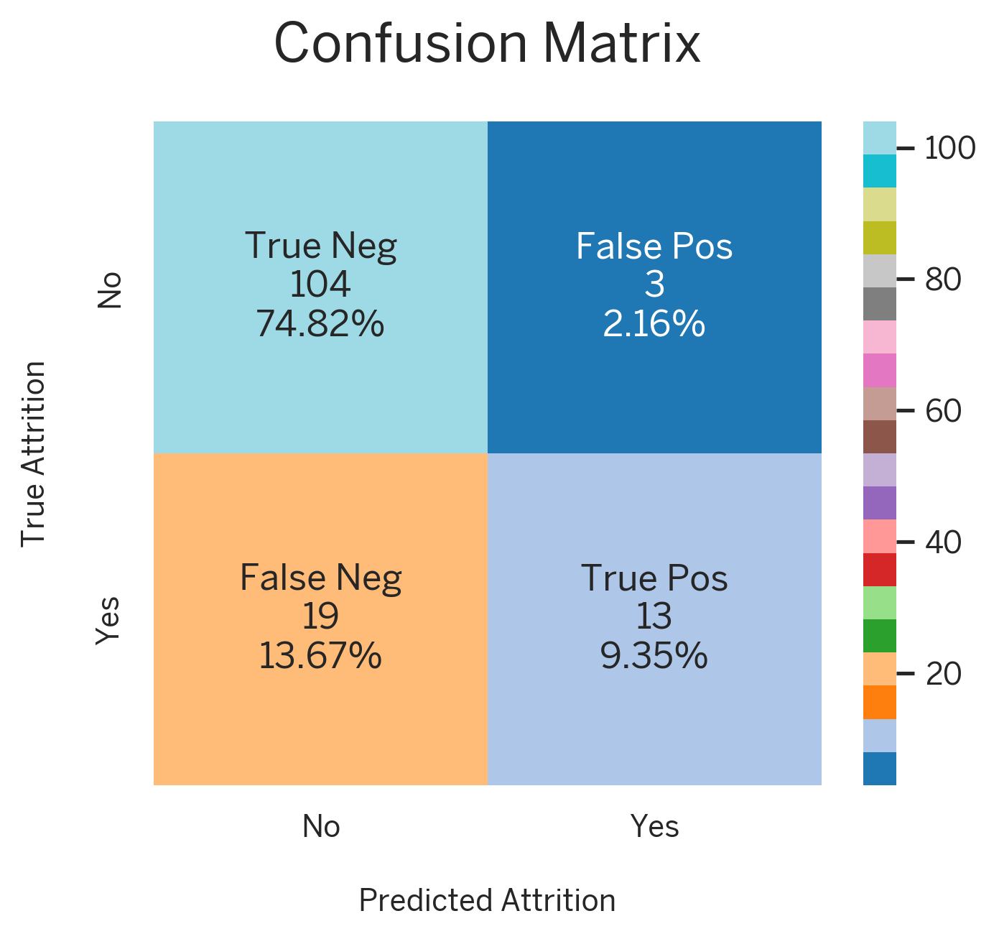

In [168]:
# creating and visualizing a confusion matrix, which is a helpful tool for evaluating the performance of a classification model
# The confusion matrix is a 2D table that summarizes how many data points were correctly or incorrectly classified into different categories.
matrix = confusion_matrix(y_valid, y_pred_valid)

group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
group_counts = ["{0:0.0f}".format(x) for x in matrix.flatten()]
group_percentages = ["{0:.2%}".format(x) for x in matrix.flatten() / np.sum(matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
labels = np.asarray(labels).reshape(2, 2)

# visualisation
plt.figure(figsize = (5, 4))
sns.heatmap(matrix, annot = labels, fmt = '', cmap = 'tab20')
plt.xlabel('Predicted Attrition', fontweight = 'bold', labelpad = 15)
plt.ylabel('True Attrition', fontweight = 'bold', labelpad = 15)
plt.xticks([0.5, 1.5], ['No', 'Yes'])
plt.yticks([0.5, 1.5], ['No', 'Yes'])
plt.title('Confusion Matrix', fontstyle = 'italic', fontweight = 'bold', fontsize = 18, pad = 20)
# plt.savefig(f"{gd_path}/gambar/confsmetrix.png", bbox_inches = 'tight', dpi = 150, transparent = True)
plt.show()

In [169]:
# coefficient value for each feature (indicates how big a chance is to predict the label)

df_coef = pd.DataFrame(columns = ['Feature', 'Coefficient'])
for feat, coef in zip(lr.feature_names_in_, lr.coef_[0]):
    #df_coef = df_coef.append(pd.DataFrame({'Feature' : feat, 'Coefficient' : coef}, columns = ['Feature', 'Coefficient'], index = [0]), ignore_index = True)
    df_coef = pd.concat([df_coef, pd.DataFrame({'Feature' : feat, 'Coefficient' : coef}, columns = ['Feature', 'Coefficient'], index = [0])], ignore_index = True)

df_coef['Abs_Coefficient'] = abs(df_coef['Coefficient'])
df_coef = df_coef.sort_values('Coefficient', ascending = False).reset_index(drop = True)
# df_coef.iloc[0:10] # top 10
df_coef

,Feature,Coefficient,Abs_Coefficient
0,NumCompaniesWorked,1.704556,1.704556
1,OverTime,1.586932,1.586932
2,YearsSinceLastPromotion,1.223191,1.223191
3,EnvironmentSatisfaction_1,1.076904,1.076904
4,JobLevel_Overtime,1.068673,1.068673
...,...,...,...
78,DailyRate,-1.004174,1.004174
79,YearsWithCurrManager,-1.027574,1.027574
80,JobLevel_2,-1.107974,1.107974
81,JobRole_Research Director,-1.404111,1.404111


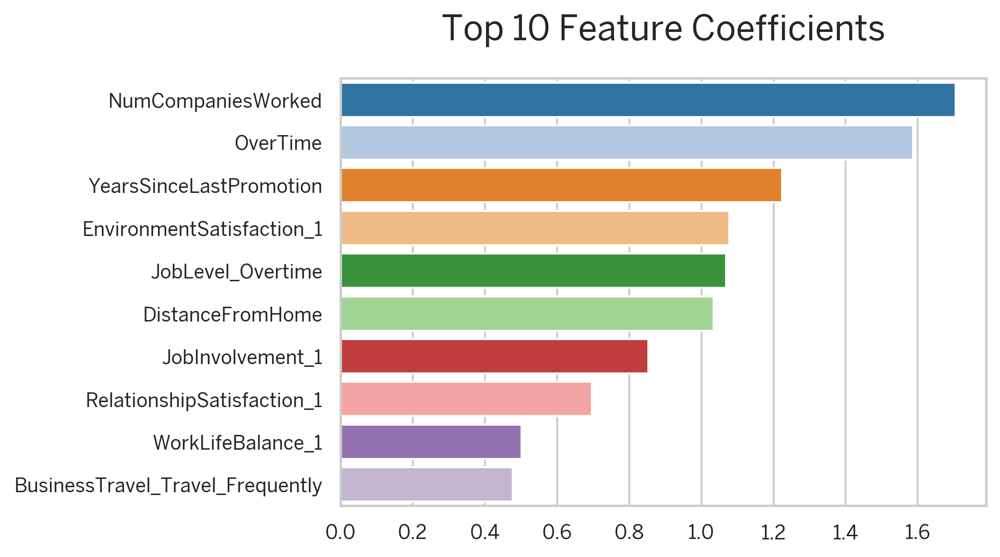

In [170]:
# set plot size
plt.figure(figsize = (6, 4))

# plotting the feature coefficients
sns.barplot(y = 'Feature', x = 'Coefficient', data = df_coef.iloc[0:10], palette = 'tab20')
plt.title('Top 10 Feature Coefficients', fontstyle = 'italic', fontweight = 'bold', fontsize = 18, pad = 20)
plt.xlabel('') # clear label
plt.ylabel('') # clear label

# plt.savefig(f"{gd_path}/gambar/coef_top10.png", bbox_inches = 'tight', dpi = 150, transparent = True)
plt.show()

# Simulation

**Business simulation to reduce turnover rates.**

## Initial

In [171]:
# load dataset
#df_sim = df_raw.copy()
df_sim = df.copy()

df_sim = df_sim.drop(['Attrition', 'EmployeeCount', 'Over18', 'StandardHours', 'EmployeeNumber'], axis = 1)
# df_sim = pd.read_csv(f"{gd_path}/WA_Fn-UseC_-HR-Employee-Attrition.csv").drop(['Attrition', 'EmployeeCount', 'Over18', 'StandardHours', 'EmployeeNumber'], axis = 1)
df_sim.head(2)

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5
1,49,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,No,23,4,4,1,10,3,3,10,7,1,7


In [172]:
df_sim.shape

(1470, 30)

In [173]:
def feature_engineering(df):

    # create feature: group age
    df['GroupAge'] = np.where(df['Age'] <= 30, '18-30', np.where((df['Age'] > 30) & (df['Age'] <= 40), '31-40', np.where((df['Age'] > 40) & (df['Age'] <= 50), '41-50', '51-60')))

    # create feature: median monthly income per job level (below == 1, above == 0)
    MedIncome = df.groupby(['JobLevel'])['MonthlyIncome'].median()
    df['BelowMedIncome'] = df['JobLevel'].apply(lambda x: MedIncome[x])
    df['BelowMedIncome'] = np.where(df['MonthlyIncome'] < df['BelowMedIncome'], 1, 0)

    # create feature: group age (18-30) & overtime (yes)
    df['GroupAge_Overtime'] = np.where((df['GroupAge'] == '18-30') & (df['OverTime'] == 'Yes'), 1, 0)

    # create feature: job level (1) & overtime (yes)
    df['JobLevel_Overtime'] = np.where((df['JobLevel'] == 1) & (df['OverTime'] == 'Yes'), 1, 0)

    # create feature: job level (1) & below median monthly income (1) & overtime (yes)
    df['JobLevel_BelowMedIncome_Overtime'] = np.where((df['JobLevel'] == 1) & (df['BelowMedIncome'] == 1) & (df['OverTime'] == 'Yes'), 1, 0)

    # standardization scaling
    std_cols = ['Age']
    for col in std_cols:
        x = df[col].values.reshape(len(df), 1)
        scaler = StandardScaler()
        scaler.fit(x)
        x_scaled = scaler.transform(x)
        df[col] = x_scaled

    # normalization scaling
    nrm_cols = ['DailyRate', 'DistanceFromHome', 'HourlyRate', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']
    for col in nrm_cols:
        x = df[col].values.reshape(len(df), 1)
        scaler = MinMaxScaler()
        scaler.fit(x)
        x_scaled = scaler.transform(x)
        df[col] = x_scaled

    # traditional labeling
    df['OverTime'] = df['OverTime'].map({'No' : 0, 'Yes' : 1})
    df['Gender'] = df['Gender'].map({'Female' : 0, 'Male' : 1})
    df['PerformanceRating'] = df['PerformanceRating'].map({3 : 0, 4 : 1}) # only consist of 2 unique values

    # one-hot encoding
    onehot_cols = ['BusinessTravel', 'Department', 'EducationField', 'JobRole', 'MaritalStatus', 'Education', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'RelationshipSatisfaction', 'StockOptionLevel', 'WorkLifeBalance', 'GroupAge']
    for col in onehot_cols:
        onehot = pd.get_dummies(df[col], prefix = col)
        dummies_cols = list(onehot.columns)
        df = df.join(onehot)
    df = df.drop(onehot_cols, axis = 1)

    return df

In [174]:
def plot_target(df):

    data = df.groupby(['Attrition']).size().reset_index().rename({0 : 'Size'}, axis = 1)
    data['Attrition'] = data['Attrition'].map({0 : 'No', 1 : 'Yes'})

    # plot attrition
    plt.figure(figsize = (2, 3))
    sns.barplot(x = 'Attrition', y = 'Size', data = data, palette = 'tab20')
    x = 0
    for y in data['Size']:
        s = f"{y / data['Size'].sum():.2%}"
        plt.text(x = x, y = y + 50, s = s, fontsize = 12, ha = 'center')
        x += 1
    plt.ylim(0, 1500)
    plt.xlabel('')
    plt.ylabel('Num of Employees', fontweight = 'bold', labelpad = 10)
    plt.title('Attrition', fontstyle = 'italic', fontweight = 'bold', fontsize = 18, pad = 15)
    plt.show()

## Before Treatment

Predict employees who have the potential to leave the company so that several treatments can then be carried out.

In [175]:
df_bef = df_sim.copy()
df_bef = feature_engineering(df_bef)
df_bef.head(2)

,Age,DailyRate,DistanceFromHome,Gender,HourlyRate,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BelowMedIncome,GroupAge_Overtime,JobLevel_Overtime,JobLevel_BelowMedIncome_Overtime,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,...,JobLevel_1,JobLevel_2,JobLevel_3,JobLevel_4,JobLevel_5,JobSatisfaction_1,JobSatisfaction_2,JobSatisfaction_3,JobSatisfaction_4,RelationshipSatisfaction_1,RelationshipSatisfaction_2,RelationshipSatisfaction_3,RelationshipSatisfaction_4,StockOptionLevel_0,StockOptionLevel_1,StockOptionLevel_2,StockOptionLevel_3,WorkLifeBalance_1,WorkLifeBalance_2,WorkLifeBalance_3,WorkLifeBalance_4,GroupAge_18-30,GroupAge_31-40,GroupAge_41-50,GroupAge_51-60
0,0.446350,0.71582,0.00,0,0.914286,0.262454,0.698053,0.888889,1,0.000000,0,0.20,0.0,0.15,0.222222,0.000000,0.294118,0,0,0,0,False,False,True,False,...,False,True,False,False,False,False,False,False,True,True,False,False,False,True,False,False,False,True,False,False,False,False,False,True,False
1,1.322365,0.12670,0.25,1,0.442857,0.217009,0.916001,0.111111,0,0.857143,1,0.25,0.5,0.25,0.388889,0.066667,0.411765,1,0,0,0,False,True,False,False,...,False,True,False,False,False,False,True,False,False,False,False,False,True,False,True,False,False,False,False,True,False,False,False,True,False


In [176]:
df_bef.shape

(1470, 83)

In [177]:
# predict
attrition = lr.predict(df_bef)

df_bef['Attrition'] = attrition
df_bef.head(2)

,Age,DailyRate,DistanceFromHome,Gender,HourlyRate,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BelowMedIncome,GroupAge_Overtime,JobLevel_Overtime,JobLevel_BelowMedIncome_Overtime,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,...,JobLevel_2,JobLevel_3,JobLevel_4,JobLevel_5,JobSatisfaction_1,JobSatisfaction_2,JobSatisfaction_3,JobSatisfaction_4,RelationshipSatisfaction_1,RelationshipSatisfaction_2,RelationshipSatisfaction_3,RelationshipSatisfaction_4,StockOptionLevel_0,StockOptionLevel_1,StockOptionLevel_2,StockOptionLevel_3,WorkLifeBalance_1,WorkLifeBalance_2,WorkLifeBalance_3,WorkLifeBalance_4,GroupAge_18-30,GroupAge_31-40,GroupAge_41-50,GroupAge_51-60,Attrition
0,0.446350,0.71582,0.00,0,0.914286,0.262454,0.698053,0.888889,1,0.000000,0,0.20,0.0,0.15,0.222222,0.000000,0.294118,0,0,0,0,False,False,True,False,...,True,False,False,False,False,False,False,True,True,False,False,False,True,False,False,False,True,False,False,False,False,False,True,False,1
1,1.322365,0.12670,0.25,1,0.442857,0.217009,0.916001,0.111111,0,0.857143,1,0.25,0.5,0.25,0.388889,0.066667,0.411765,1,0,0,0,False,True,False,False,...,True,False,False,False,False,True,False,False,False,False,False,True,False,True,False,False,False,False,True,False,False,False,True,False,0


In [178]:
df_bef.groupby(['Attrition']).size()

Attrition
0    1328
1     142
dtype: int64

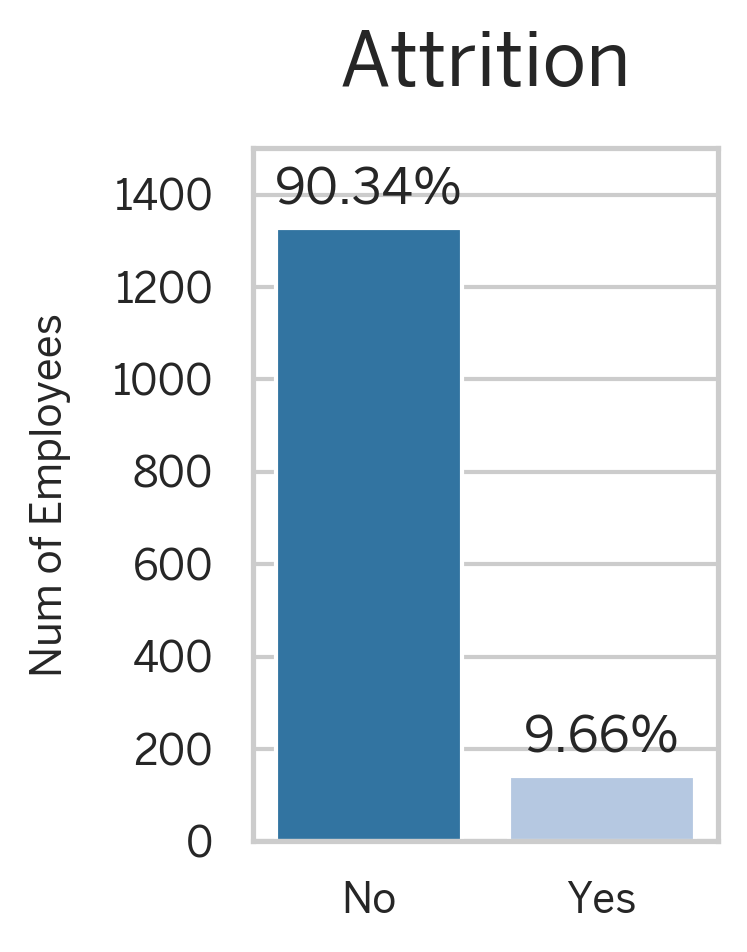

In [179]:
plot_target(df_bef)

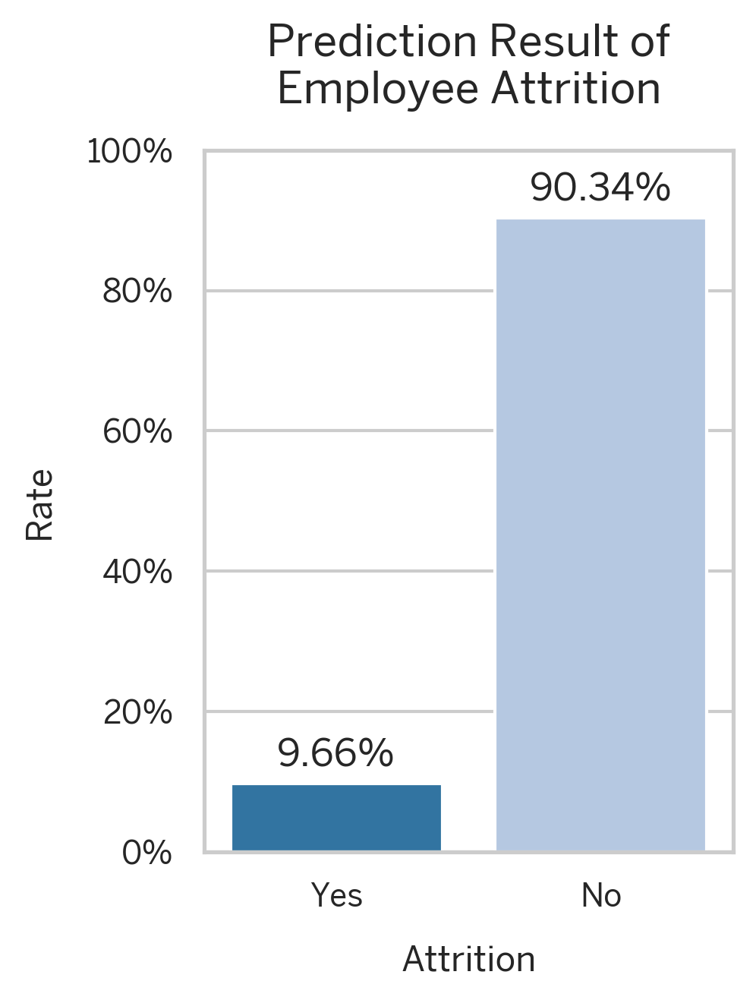

In [180]:
data = df_bef.groupby(['Attrition']).size().reset_index().rename({0 : 'Size'}, axis = 1).sort_values('Attrition', ascending = False)
data['Attrition'] = data['Attrition'].map({0 : 'No', 1 : 'Yes'})
data['Percentage'] = data['Size'].apply(lambda x: x / data['Size'].sum())

# plot attrition
plt.figure(figsize = (3, 4))
sns.barplot(x = 'Attrition', y = 'Percentage', data = data, palette = 'tab20')
x = 0
for y in data['Percentage']:
    s = f"{y:.2%}"
    plt.text(x = x, y = y + 0.025, s = s, fontsize = 12, ha = 'center')
    x += 1
plt.ylim(0, 1)
yticks = list(np.arange(0, 1.1, 0.2))
yticks_pct = []
for i in yticks:
    yticks_pct.append("{:.0%}".format(i))
plt.yticks(yticks, yticks_pct)
plt.xlabel('Attrition', fontweight = 'bold', fontsize = 11, labelpad = 10)
plt.ylabel('Rate', fontweight = 'bold', fontsize = 11, labelpad = 10)
plt.title('Prediction Result of\nEmployee Attrition', fontstyle = 'italic', fontweight = 'bold', fontsize = 14, pad = 15)
# plt.savefig(f"{gd_path}predict_result.png", bbox_inches = 'tight', dpi = 150, transparent = True)
plt.show()

With the help of ML, the probability of potential employees leaving the company was 142 out of 1470 people (9.66%). It is assumed that previously did not know the truth.

Following up on the prediction results, we recommend stakeholders to treat employees based on features with high coefficient values ​​(*see Top 10 Feature Coefficients graph*). We prioritize several attributes, namely **Overtime** and **Years Since Last Promotion**.

Pay attention to employees who are predicted to have the potential to leave the company,
- Are there employees with a performance rating above average (excellent and outstanding) which means they deserve to be promoted, but have not received a promotion for years?
- Are there employees who work overtime, but have low job involvement?

## After Treatment

Trying to carry out several treatments for employees who have the potential to leave the company based on predicted results.

In [181]:
df_aft = df_sim.copy()
df_aft['Attrition_Pred'] = attrition
df_aft.head(2)

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition_Pred
0,41,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5,1
1,49,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,No,23,4,4,1,10,3,3,10,7,1,7,0


In [182]:
df_aft.shape

(1470, 31)

In this case, we try to give promotions to several employees who are worthy of promotion by filtering as follows:
- Predicted attrition = Yes
- Performance rating >= 3 (excellent and outstanding)
- Years since last promotion >= 2 (last promoted above equals 2 years)

The changes made are:
- Added one job level, for example: from 1 to 2, 2 to 3, etc.
- Changed the years since last promotion attribute to 0

In [183]:
# filtering
ft_attrition = (df_aft['Attrition_Pred'] == 1)
ft_performance = (df_aft['PerformanceRating'] >= 3)
ft_promotion = (df_aft['YearsSinceLastPromotion'] >= 2)
filtering = ft_attrition & ft_performance & ft_promotion
# filtering = ft_performance & ft_promotion

df_aft[['PerformanceRating', 'YearsSinceLastPromotion', 'JobLevel']].loc[filtering]

,PerformanceRating,YearsSinceLastPromotion,JobLevel
26,4,6,1
51,3,2,1
63,3,7,3
122,3,4,1
124,3,7,2
323,3,2,1
514,3,9,1
525,3,2,2
540,3,3,1
547,3,2,1


In [184]:
# transformasi nilai
df_aft['JobLevel'] = np.where(filtering, df_aft['JobLevel']+1, df_aft['JobLevel'])
df_aft['YearsSinceLastPromotion'] = np.where(filtering, 0, df_aft['YearsSinceLastPromotion'])

df_aft[['PerformanceRating', 'YearsSinceLastPromotion', 'JobLevel']].loc[filtering]

,PerformanceRating,YearsSinceLastPromotion,JobLevel
26,4,0,2
51,3,0,2
63,3,0,4
122,3,0,2
124,3,0,3
323,3,0,2
514,3,0,2
525,3,0,3
540,3,0,2
547,3,0,2


In this case we try to increase 1 job involvement level by filtering as follows:
- Predicted attrition = Yes
- Job involvement <= 3
- Overtime = Yes

The changes made are:
- Add one level of job involvement, for example: from 1 to 2, 2 to 3, etc.

In [185]:
# filtering
ft_attrition = (df_aft['Attrition_Pred'] == 1)
ft_involvement = (df_aft['JobInvolvement'] <= 3)
ft_overtime = (df_aft['OverTime'] == 'Yes')
filtering = ft_attrition & ft_involvement & ft_overtime

df_aft[['JobInvolvement', 'OverTime']].loc[filtering]

,JobInvolvement,OverTime
0,3,Yes
2,2,Yes
14,2,Yes
26,1,Yes
36,2,Yes
...,...,...
1396,3,Yes
1413,3,Yes
1422,3,Yes
1436,3,Yes


In [186]:
# transformasi nilai
df_aft['JobInvolvement'] = np.where(filtering, df_aft['JobInvolvement']+1, df_aft['JobInvolvement'])

df_aft[['JobInvolvement', 'OverTime']].loc[filtering]

,JobInvolvement,OverTime
0,4,Yes
2,3,Yes
14,3,Yes
26,2,Yes
36,3,Yes
...,...,...
1396,4,Yes
1413,4,Yes
1422,4,Yes
1436,4,Yes


In [187]:
df_aft = df_aft.drop(['Attrition_Pred'], axis = 1)
df_aft.head(2)

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,4,2,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5
1,49,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,No,23,4,4,1,10,3,3,10,7,1,7


In [188]:
df_aft = feature_engineering(df_aft)
df_aft.head(2)

,Age,DailyRate,DistanceFromHome,Gender,HourlyRate,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BelowMedIncome,GroupAge_Overtime,JobLevel_Overtime,JobLevel_BelowMedIncome_Overtime,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,...,JobLevel_1,JobLevel_2,JobLevel_3,JobLevel_4,JobLevel_5,JobSatisfaction_1,JobSatisfaction_2,JobSatisfaction_3,JobSatisfaction_4,RelationshipSatisfaction_1,RelationshipSatisfaction_2,RelationshipSatisfaction_3,RelationshipSatisfaction_4,StockOptionLevel_0,StockOptionLevel_1,StockOptionLevel_2,StockOptionLevel_3,WorkLifeBalance_1,WorkLifeBalance_2,WorkLifeBalance_3,WorkLifeBalance_4,GroupAge_18-30,GroupAge_31-40,GroupAge_41-50,GroupAge_51-60
0,0.446350,0.71582,0.00,0,0.914286,0.262454,0.698053,0.888889,1,0.000000,0,0.20,0.0,0.15,0.222222,0.000000,0.294118,0,0,0,0,False,False,True,False,...,False,True,False,False,False,False,False,False,True,True,False,False,False,True,False,False,False,True,False,False,False,False,False,True,False
1,1.322365,0.12670,0.25,1,0.442857,0.217009,0.916001,0.111111,0,0.857143,1,0.25,0.5,0.25,0.388889,0.066667,0.411765,1,0,0,0,False,True,False,False,...,False,True,False,False,False,False,True,False,False,False,False,False,True,False,True,False,False,False,False,True,False,False,False,True,False


In [189]:
df_aft.shape

(1470, 83)

In [190]:
# predict
attrition = lr.predict(df_aft)

df_aft['Attrition'] = attrition
df_aft.head(2)

,Age,DailyRate,DistanceFromHome,Gender,HourlyRate,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BelowMedIncome,GroupAge_Overtime,JobLevel_Overtime,JobLevel_BelowMedIncome_Overtime,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,...,JobLevel_2,JobLevel_3,JobLevel_4,JobLevel_5,JobSatisfaction_1,JobSatisfaction_2,JobSatisfaction_3,JobSatisfaction_4,RelationshipSatisfaction_1,RelationshipSatisfaction_2,RelationshipSatisfaction_3,RelationshipSatisfaction_4,StockOptionLevel_0,StockOptionLevel_1,StockOptionLevel_2,StockOptionLevel_3,WorkLifeBalance_1,WorkLifeBalance_2,WorkLifeBalance_3,WorkLifeBalance_4,GroupAge_18-30,GroupAge_31-40,GroupAge_41-50,GroupAge_51-60,Attrition
0,0.446350,0.71582,0.00,0,0.914286,0.262454,0.698053,0.888889,1,0.000000,0,0.20,0.0,0.15,0.222222,0.000000,0.294118,0,0,0,0,False,False,True,False,...,True,False,False,False,False,False,False,True,True,False,False,False,True,False,False,False,True,False,False,False,False,False,True,False,0
1,1.322365,0.12670,0.25,1,0.442857,0.217009,0.916001,0.111111,0,0.857143,1,0.25,0.5,0.25,0.388889,0.066667,0.411765,1,0,0,0,False,True,False,False,...,True,False,False,False,False,True,False,False,False,False,False,True,False,True,False,False,False,False,True,False,False,False,True,False,0


In [191]:
df_aft.groupby(['Attrition']).size()

Attrition
0    1372
1      98
dtype: int64

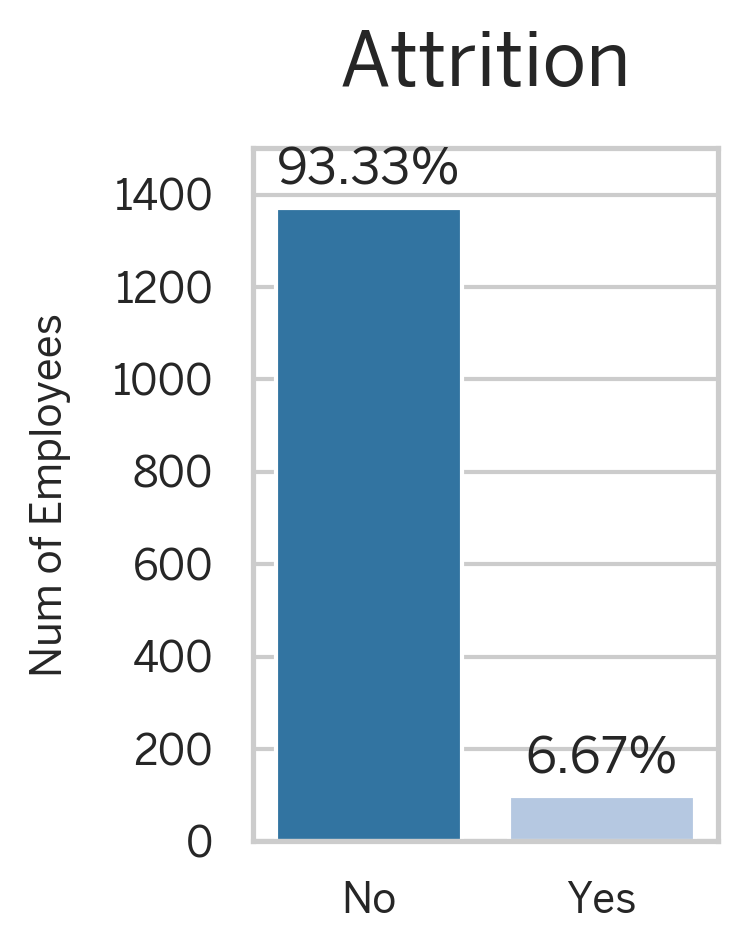

In [192]:
plot_target(df_aft)

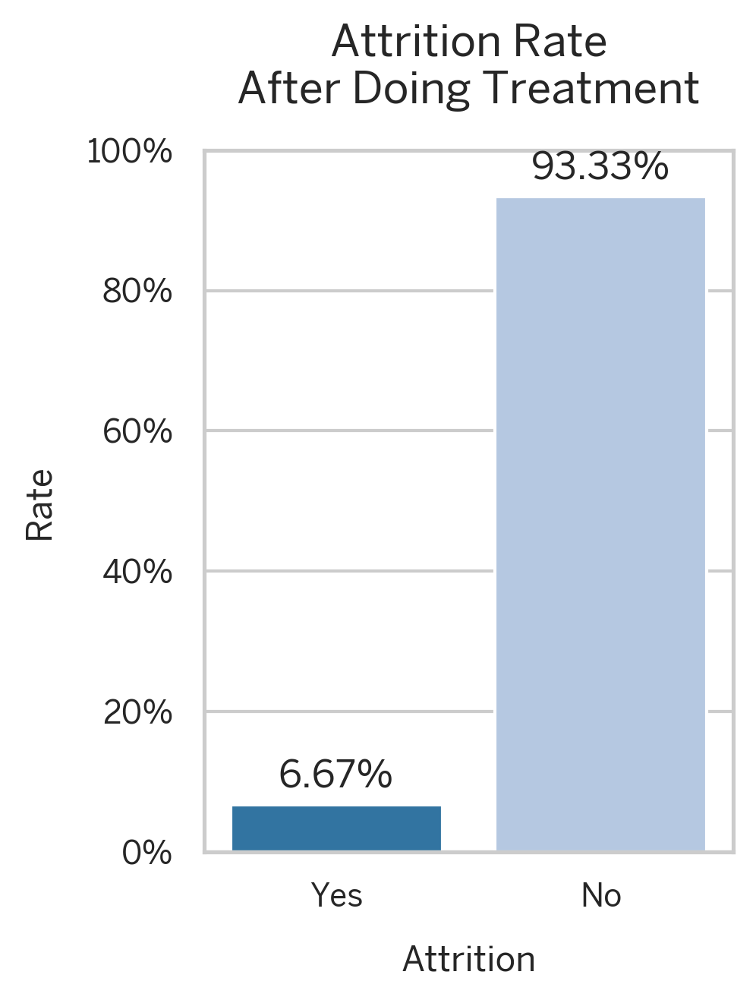

In [193]:
data = df_aft.groupby(['Attrition']).size().reset_index().rename({0 : 'Size'}, axis = 1).sort_values('Attrition', ascending = False)
data['Attrition'] = data['Attrition'].map({0 : 'No', 1 : 'Yes'})
data['Percentage'] = data['Size'].apply(lambda x: x / data['Size'].sum())

# plot attrition
plt.figure(figsize = (3, 4))
sns.barplot(x = 'Attrition', y = 'Percentage', data = data, palette = 'tab20')
x = 0
for y in data['Percentage']:
    s = f"{y:.2%}"
    plt.text(x = x, y = y + 0.025, s = s, fontsize = 12, ha = 'center')
    x += 1
plt.ylim(0, 1)
yticks = list(np.arange(0, 1.1, 0.2))
yticks_pct = []
for i in yticks:
    yticks_pct.append("{:.0%}".format(i))
plt.yticks(yticks, yticks_pct)
plt.xlabel('Attrition', fontweight = 'bold', fontsize = 11, labelpad = 10)
plt.ylabel('Rate', fontweight = 'bold', fontsize = 11, labelpad = 10)
plt.title('Attrition Rate\nAfter Doing Treatment', fontstyle = 'italic', fontweight = 'bold', fontsize = 14, pad = 15)
# plt.savefig(f"{gd_path}after_treatment.png", bbox_inches = 'tight', dpi = 150, transparent = True)
plt.show()

The attrition rate decreased from 9.66% to 6.67% (reduced 2.99%), leaving 98 employees with the potential to leave the company.